$C(x, y) = c_g (x, y)+U_{REF}(x, y)-2\alpha(x,y) A_0(x,y)$

/tmp/ipykernel_166681/2602137822.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])


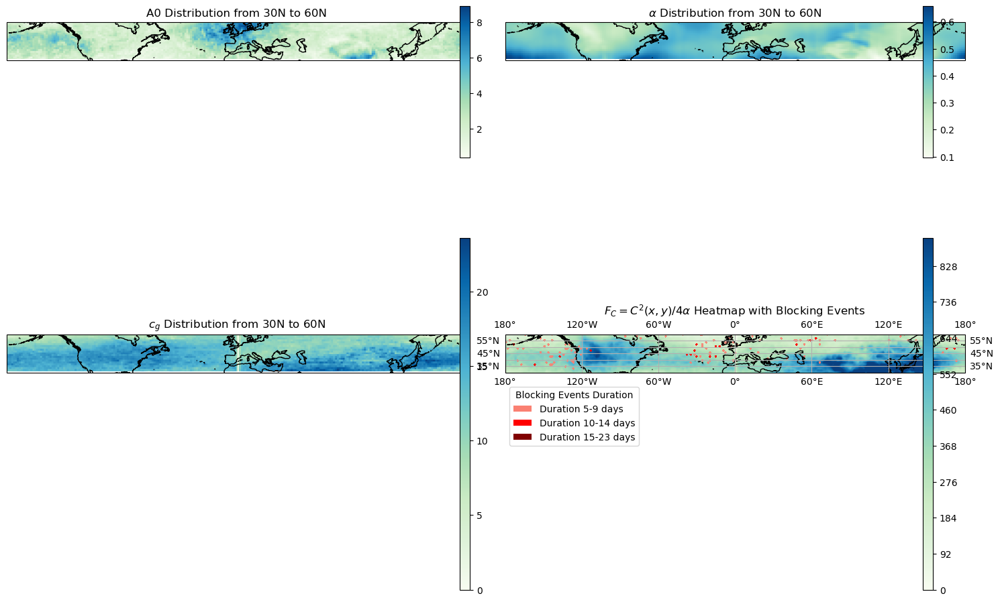

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import os
from matplotlib.patches import Patch
import cartopy.feature as cfeature

# Load data for all four plots (assuming the files exist and are accessible)
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/"
A0_winter_file = os.path.join(output_directory, "hn2016-falwa_calculation", "dist_of_A0_winter.npy")
slope_data_djf_file = os.path.join(output_directory, "alpha_regression_DJF", "slope_data_djf.npy")
reduced_Cg_file = os.path.join(output_directory, "hn2016-falwa_calculation", "reduced_Cg.npy")
capacity_file = os.path.join(output_directory, "hn2016-falwa_calculation", "NH18FluxCapacity.npy")
blocking_data_NH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0NH.npy")
blocking_data_SH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0SH.npy")

# Load the arrays
A0_winter = np.load(A0_winter_file)[80:101, :]
slope_data_djf = -np.load(slope_data_djf_file)[80:101, :]
reduced_Cg = np.load(reduced_Cg_file)[80:101, :]
capacity = np.load(capacity_file)
blocking_data_NH = np.load(blocking_data_NH_file, allow_pickle=True)
blocking_data_SH = np.load(blocking_data_SH_file, allow_pickle=True)

# Other required data and calculations for the fourth plot
blocking_data = np.vstack((blocking_data_NH, blocking_data_SH))
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
capacity = np.clip(capacity, vmin_val, vmax_val)
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(15, 15), subplot_kw={'projection': ccrs.PlateCarree()})

# Define a common colormap for all plots
common_cmap = 'GnBu'

# Plot 1: A0 Distribution
heatmap1 = axs[0, 0].imshow(A0_winter, extent=[0, 361, 30, 60], cmap=common_cmap, origin='lower', transform=ccrs.PlateCarree())
axs[0, 0].set_title('A0 Distribution from 30N to 60N')
axs[0, 0].coastlines()
axs[0, 0].set_extent([-180, 180, 30, 60], crs=ccrs.PlateCarree())

# Plot 2: Slope Data DJF
heatmap2 = axs[0, 1].imshow(slope_data_djf, extent=[0, 361, 30, 60], cmap=common_cmap, origin='lower', transform=ccrs.PlateCarree())
axs[0, 1].set_title(r'$\alpha$ Distribution from 30N to 60N')
axs[0, 1].coastlines()
axs[0, 1].set_extent([-180, 180, 30, 60], crs=ccrs.PlateCarree())

# Plot 3: Reduced Cg
heatmap3 = axs[1, 0].imshow(reduced_Cg, extent=[0, 361, 30, 60], cmap=common_cmap, origin='lower', transform=ccrs.PlateCarree())
axs[1, 0].set_title(r'$c_g$ Distribution from 30N to 60N')
axs[1, 0].coastlines()
axs[1, 0].set_extent([-180, 180, 30, 60], crs=ccrs.PlateCarree())

# Plot 4: Capacity with Blocking Events
lon_vals = np.linspace(0, 360, 240)
lat_vals = np.linspace(30, 60, len(lat_indices))
lon, lat = np.meshgrid(lon_vals, lat_vals)

cs = axs[1, 1].contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())
axs[1, 1].contourf(lon, lat, blocking_grid_5_9_subset, levels=[0.5, 1.5], colors=['salmon'], alpha=0.9, transform=ccrs.PlateCarree())
axs[1, 1].contourf(lon, lat, blocking_grid_10_14_subset, levels=[0.5, 1.5], colors=['red'], alpha=0.9, transform=ccrs.PlateCarree())
axs[1, 1].contourf(lon, lat, blocking_grid_15_23_subset, levels=[0.5, 1.5], colors=['maroon'], alpha=0.9, transform=ccrs.PlateCarree())
axs[1, 1].set_title(r'$F_C = C^2(x,y) / 4 \alpha$ Heatmap with Blocking Events')
axs[1, 1].coastlines()
axs[1, 1].gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Adding colorbars
cbar_ax1 = fig.add_axes([0.46, 0.53, 0.01, 0.15]) # adjust the location and the size of the colorbar for plot 1
cbar_ax2 = fig.add_axes([0.92, 0.53, 0.01, 0.15]) # adjust the location and the size of the colorbar for plot 2
cbar_ax3 = fig.add_axes([0.46, 0.1, 0.01, 0.35])  # adjust the location and the size of the colorbar for plot 3
cbar_ax4 = fig.add_axes([0.92, 0.1, 0.01, 0.35])  # adjust the location and the size of the colorbar for plot 4

fig.colorbar(heatmap1, cax=cbar_ax1)
fig.colorbar(heatmap2, cax=cbar_ax2)
fig.colorbar(heatmap3, cax=cbar_ax3)
fig.colorbar(cs, cax=cbar_ax4)

# Adjusting legend position for plot 4
legend_elements = [
    Patch(facecolor='salmon', label='Duration 5-9 days'),
    Patch(facecolor='red', label='Duration 10-14 days'),
    Patch(facecolor='maroon', label='Duration 15-23 days')
]
legend = axs[1, 1].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.15, -0.25), title='Blocking Events Duration')

# Adjust layout to prevent overlap and make room for the legend and colorbars
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()

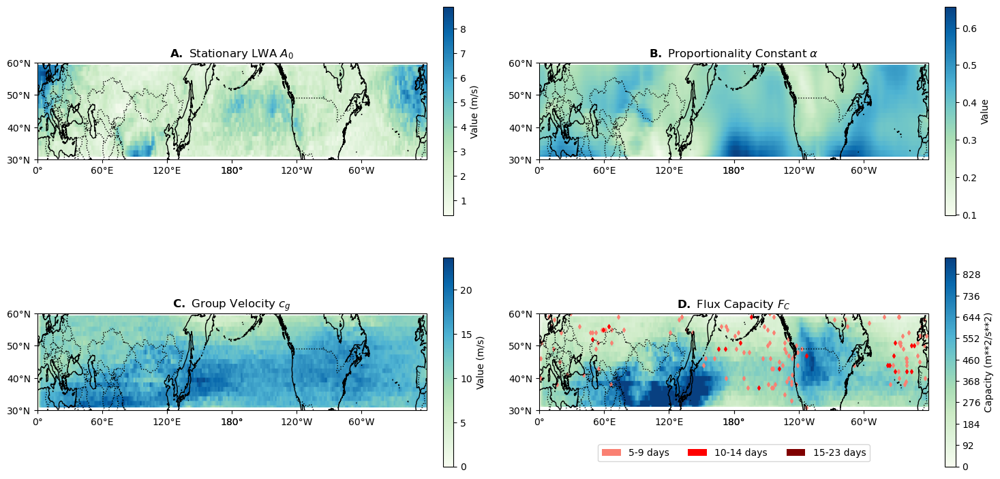

In [61]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import numpy as np
import os
from matplotlib.patches import Patch
import cartopy.feature as cfeature

# Load data for all four plots (assuming the files exist and are accessible)
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/"
A0_winter_file = os.path.join(output_directory, "hn2016-falwa_calculation", "dist_of_A0_winter.npy")
slope_data_djf_file = os.path.join(output_directory, "alpha_regression_DJF", "slope_data_djf.npy")
reduced_Cg_file = os.path.join(output_directory, "hn2016-falwa_calculation", "reduced_Cg.npy")
capacity_file = os.path.join(output_directory, "hn2016-falwa_calculation", "NH18FluxCapacity.npy")
blocking_data_NH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0NH.npy")
blocking_data_SH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0SH.npy")

# Load the arrays
A0_winter = np.load(A0_winter_file)[80:101, :]
slope_data_djf = -np.load(slope_data_djf_file)[80:101, :]
reduced_Cg = np.load(reduced_Cg_file)[80:101, :]
capacity = np.load(capacity_file)
blocking_data_NH = np.load(blocking_data_NH_file, allow_pickle=True)
blocking_data_SH = np.load(blocking_data_SH_file, allow_pickle=True)

# Other required data and calculations for the fourth plot
blocking_data = np.vstack((blocking_data_NH, blocking_data_SH))
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
capacity = np.clip(capacity, vmin_val, vmax_val)
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]



fig, axs = plt.subplots(2, 2, figsize=(15, 7.5), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})




# Define a common colormap for all plots
common_cmap = 'GnBu'

# Define function to plot each map to avoid repetition
def plot_map(ax, data, title, transform=ccrs.PlateCarree(), cmap=common_cmap):
    ax.set_extent([0, 361, 30, 60], transform)
    heatmap = ax.imshow(data, extent=[0, 361, 30, 60], transform=transform, cmap=cmap, origin='lower', aspect=3)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # 设置自定义的经纬度刻度
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
    ax.set_yticks([30, 40, 50, 60], crs=ccrs.PlateCarree())

    # 应用格式化器
    ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=False))
    ax.yaxis.set_major_formatter(LatitudeFormatter())

    ax.set_title(title)
    return heatmap


# Plot 1-3
heatmap1 = plot_map(axs[0, 0], A0_winter, r'$\mathbf{A. }$ Stationary LWA $A_0$')
heatmap2 = plot_map(axs[0, 1], slope_data_djf, r'$\mathbf{B. }$ Proportionality Constant $\alpha$')
heatmap3 = plot_map(axs[1, 0], reduced_Cg, r'$\mathbf{C. }$ Group Velocity $c_g$')

# Plot 4: Capacity with Blocking Events
ax4 = axs[1, 1]
plot_map(ax4, capacity_subset, r'$\mathbf{D. }$ Flux Capacity $F_C$')
lon_vals = np.linspace(0, 360, 240)
lat_vals = np.linspace(30, 60, len(lat_indices))
lon, lat = np.meshgrid(lon_vals, lat_vals)

for lon, lat, duration in zip(longitudes, latitudes, durations):
    color = 'salmon' if 5 <= duration <= 9 else 'red' if 10 <= duration <= 14 else 'maroon'
    ax4.scatter(lon, lat, marker='d', color=color, s = 10, transform=ccrs.PlateCarree()) 


# Add colorbars for each plot
cbar_labels = ['Value (m/s)', 'Value', 'Value (m/s)', 'Capacity (m**2/s**2)']
for i, heatmap in enumerate([heatmap1, heatmap2, heatmap3, cs]):
    row, col = divmod(i, 2)
    cbar = fig.colorbar(heatmap, ax=axs[row, col], orientation='vertical', fraction=0.03, pad=0.04)
    cbar.set_label(cbar_labels[i])

# Adjust legend for Plot 4 to spread horizontally and center below the plots
legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = axs[1, 1].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)




# Adjust layout to remove excessive margins
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.2, hspace=0.2)

# Show the plot
plt.show()

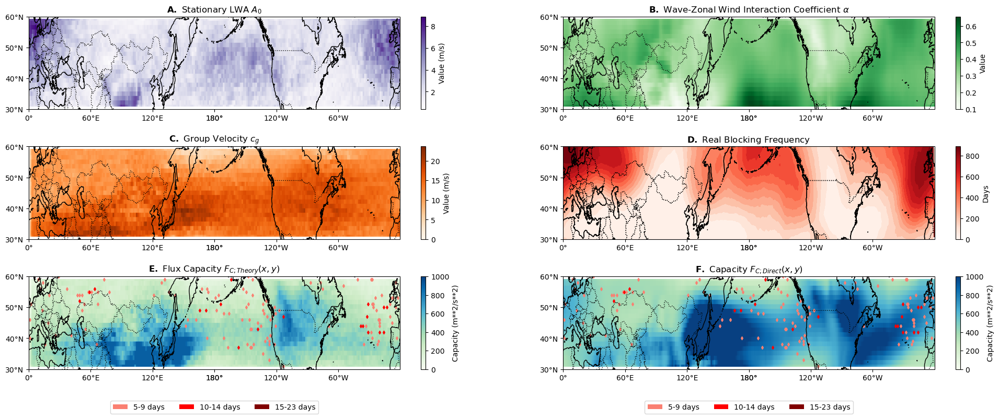

In [1]:
####### Correct
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import numpy as np
import os
from matplotlib.patches import Patch
import cartopy.feature as cfeature

import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import os
from matplotlib.patches import Patch
import cartopy.feature as cfeature

# Load data for all four plots (assuming the files exist and are accessible)
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/"
A0_winter_file = os.path.join(output_directory, "hn2016-falwa_calculation", "dist_of_A0_winter.npy")
slope_data_djf_file = os.path.join(output_directory, "alpha_regression_DJF", "slope_data_djf.npy")
reduced_Cg_file = os.path.join(output_directory, "hn2016-falwa_calculation", "reduced_Cg.npy")
capacity_file = os.path.join(output_directory, "hn2016-falwa_calculation", "NH18FluxCapacity.npy")
blocking_data_NH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0NH.npy")
blocking_data_SH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0SH.npy")

# Load the arrays
A0_winter = np.load(A0_winter_file)[80:101, :]
slope_data_djf = -np.load(slope_data_djf_file)[80:101, :]
reduced_Cg = np.load(reduced_Cg_file)[80:101, :]
capacity = np.load(capacity_file)
blocking_data_NH = np.load(blocking_data_NH_file, allow_pickle=True)
blocking_data_SH = np.load(blocking_data_SH_file, allow_pickle=True)



real_capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity_DJF.npy')
# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(real_capacity, 1)
vmax_val = np.nanpercentile(real_capacity, 99)
# print(vmin_val)
# print(vmax_val)
# Clip the capacity values to lie within the determined min and max
real_capacity = np.clip(real_capacity, vmin_val, vmax_val)


blocking_data_NH = np.load(blocking_data_NH_file, allow_pickle=True)
blocking_data_SH = np.load(blocking_data_SH_file, allow_pickle=True)

NH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0NH.npy")
SH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0SH.npy")
BlockingFreq = NH+SH

# Latitude and Longitude data
Lat = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lat.npy")
Lon = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lon.npy")

# Filter out the latitudes that are outside of 30N to 60N
lat_indices = np.where((Lat >= 30) & (Lat <= 60))[0]
Lat = Lat[lat_indices]
BlockingFreq = BlockingFreq[lat_indices, :]

# Other required data and calculations for the fourth plot
blocking_data = np.vstack((blocking_data_NH, blocking_data_SH))
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
capacity = np.clip(capacity, vmin_val, vmax_val)
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))
capacity_subset = capacity[lat_indices, :]
real_capacity_subset = real_capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]



fig, axs = plt.subplots(3, 2, figsize=(22.5, 7.5), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})




# Define a common colormap for all plots
common_cmap = 'GnBu'

# Define function to plot each map to avoid repetition
def plot_map(ax, data, title, transform=ccrs.PlateCarree(), cmap=common_cmap, vmin=None, vmax=None):
    ax.set_extent([0, 361, 30, 60], transform)
    heatmap = ax.imshow(data, extent=[0, 361, 30, 60], transform=transform, cmap=cmap, origin='lower', aspect=3, vmin=vmin, vmax=vmax)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
    ax.set_yticks([30, 40, 50, 60], crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=False))
    ax.yaxis.set_major_formatter(LatitudeFormatter())
    ax.set_title(title)
    return heatmap

# Define individual colormaps for plots A, B, C, and D
cmap_A = 'Purples'
cmap_B = 'Greens'
cmap_C = 'Oranges'
cmap_D = 'Reds'

# Plot 1-4 with updated colormaps
heatmap1 = plot_map(axs[0, 0], A0_winter, r'$\mathbf{A. }$ Stationary LWA $A_0$', cmap=cmap_A)
heatmap2 = plot_map(axs[0, 1], slope_data_djf, r'$\mathbf{B. }$ Wave-Zonal Wind Interaction Coefficient $\alpha$', cmap=cmap_B)
heatmap3 = plot_map(axs[1, 0], reduced_Cg, r'$\mathbf{C. }$ Group Velocity $c_g$', cmap=cmap_C)
heatmap4 = plot_map(axs[1, 1], BlockingFreq, r'$\mathbf{D. }$ Real Blocking Frequency', cmap=cmap_D)


ax6 = axs[1, 1]
contour = ax6.contourf(Lon, Lat, BlockingFreq, 15, transform=ccrs.PlateCarree(), cmap=cmap_D)
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS, linestyle=':')

# Plot 4: Capacity with Blocking Events
ax4 = axs[2, 0]
cs = plot_map(ax4, capacity_subset, r'$\mathbf{E. }$ Flux Capacity $F_{C; Theory}(x,y)$', vmin=0, vmax=1000)

lon_vals = np.linspace(0, 360, 240)
lat_vals = np.linspace(30, 60, len(lat_indices))
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Plot 5: Capacity with Blocking Events

ax5 = axs[2, 1]
cs2 = plot_map(ax5, real_capacity_subset, r'$\mathbf{F. }$ Capacity $F_{C; Direct}(x,y)$', vmin=0, vmax=1000)

lon_vals = np.linspace(0, 360, 240)
lat_vals = np.linspace(30, 60, len(lat_indices))
lon, lat = np.meshgrid(lon_vals, lat_vals)

for lon, lat, duration in zip(longitudes, latitudes, durations):
    color = 'salmon' if 5 <= duration <= 9 else 'red' if 10 <= duration <= 14 else 'maroon'
    ax5.scatter(lon, lat, marker='d', color=color, s = 10, transform=ccrs.PlateCarree()) 


for lon, lat, duration in zip(longitudes, latitudes, durations):
    color = 'salmon' if 5 <= duration <= 9 else 'red' if 10 <= duration <= 14 else 'maroon'
    ax4.scatter(lon, lat, marker='d', color=color, s = 10, transform=ccrs.PlateCarree()) 


# Add colorbars for each plot
cbar_labels = ['Value (m/s)', 'Value', 'Value (m/s)', 'Days', 'Capacity (m**2/s**2)', 'Capacity (m**2/s**2)']
for i, heatmap in enumerate([heatmap1, heatmap2, heatmap3, heatmap4, cs, cs2]):
    row, col = divmod(i, 2)
    cbar = fig.colorbar(heatmap, ax=axs[row, col], orientation='vertical', fraction=0.03, pad=0.04)
    cbar.set_label(cbar_labels[i])


# Adjust legend for Plot 4 to spread horizontally and center below the plots
legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = axs[2, 0].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)
legend = axs[2, 1].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)



# Adjust layout to remove excessive margins
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.02, hspace=0.4)

# Show the plot
plt.show()

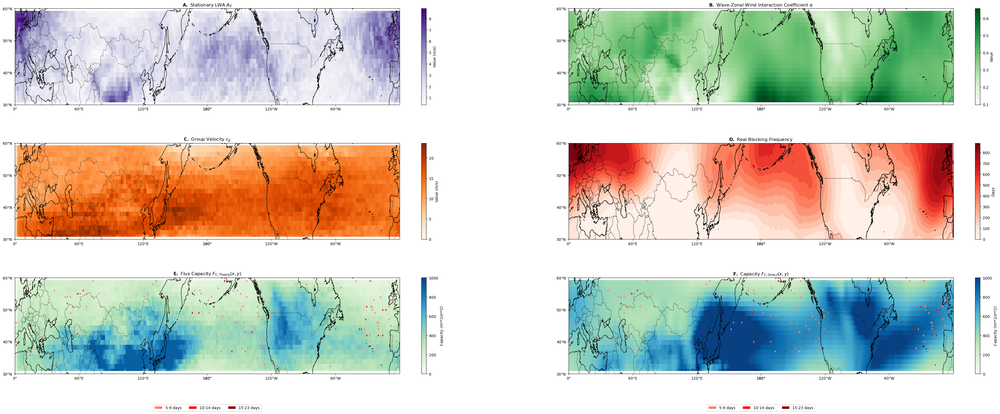

In [5]:
####### Correct
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import numpy as np
import os
from matplotlib.patches import Patch
import cartopy.feature as cfeature

import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import os
from matplotlib.patches import Patch
import cartopy.feature as cfeature

# Load data for all four plots (assuming the files exist and are accessible)
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/"
A0_winter_file = os.path.join(output_directory, "hn2016-falwa_calculation", "dist_of_A0_winter.npy")
slope_data_djf_file = os.path.join(output_directory, "alpha_regression_DJF", "slope_data_djf.npy")
reduced_Cg_file = os.path.join(output_directory, "hn2016-falwa_calculation", "reduced_Cg.npy")
capacity_file = os.path.join(output_directory, "hn2016-falwa_calculation", "NH18FluxCapacity.npy")
blocking_data_NH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0NH.npy")
blocking_data_SH_file = os.path.join(output_directory, "Ka Ying Blocking Data", "BlockingEventDate4.0SH.npy")

# Load the arrays
A0_winter = np.load(A0_winter_file)[80:101, :]
slope_data_djf = -np.load(slope_data_djf_file)[80:101, :]
reduced_Cg = np.load(reduced_Cg_file)[80:101, :]
capacity = np.load(capacity_file)
blocking_data_NH = np.load(blocking_data_NH_file, allow_pickle=True)
blocking_data_SH = np.load(blocking_data_SH_file, allow_pickle=True)



real_capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity_DJF.npy')
# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(real_capacity, 1)
vmax_val = np.nanpercentile(real_capacity, 99)
# print(vmin_val)
# print(vmax_val)
# Clip the capacity values to lie within the determined min and max
real_capacity = np.clip(real_capacity, vmin_val, vmax_val)


blocking_data_NH = np.load(blocking_data_NH_file, allow_pickle=True)
blocking_data_SH = np.load(blocking_data_SH_file, allow_pickle=True)

NH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0NH.npy")
SH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0SH.npy")
BlockingFreq = NH+SH

# Latitude and Longitude data
Lat = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lat.npy")
Lon = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lon.npy")

# Filter out the latitudes that are outside of 30N to 60N
lat_indices = np.where((Lat >= 30) & (Lat <= 60))[0]
Lat = Lat[lat_indices]
BlockingFreq = BlockingFreq[lat_indices, :]

# Other required data and calculations for the fourth plot
blocking_data = np.vstack((blocking_data_NH, blocking_data_SH))
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
capacity = np.clip(capacity, vmin_val, vmax_val)
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))
capacity_subset = capacity[lat_indices, :]
real_capacity_subset = real_capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]



fig, axs = plt.subplots(3, 2, figsize=(45, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})




# Define a common colormap for all plots
common_cmap = 'GnBu'

# Define function to plot each map to avoid repetition
def plot_map(ax, data, title, transform=ccrs.PlateCarree(), cmap=common_cmap, vmin=None, vmax=None):
    ax.set_extent([0, 361, 30, 60], transform)
    heatmap = ax.imshow(data, extent=[0, 361, 30, 60], transform=transform, cmap=cmap, origin='lower', aspect=3, vmin=vmin, vmax=vmax)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
    ax.set_yticks([30, 40, 50, 60], crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=False))
    ax.yaxis.set_major_formatter(LatitudeFormatter())
    ax.set_title(title)
    return heatmap

# Define individual colormaps for plots A, B, C, and D
cmap_A = 'Purples'
cmap_B = 'Greens'
cmap_C = 'Oranges'
cmap_D = 'Reds'

# Plot 1-4 with updated colormaps
heatmap1 = plot_map(axs[0, 0], A0_winter, r'$\mathbf{A. }$ Stationary LWA $A_0$', cmap=cmap_A)
heatmap2 = plot_map(axs[0, 1], slope_data_djf, r'$\mathbf{B. }$ Wave-Zonal Wind Interaction Coefficient $\alpha$', cmap=cmap_B)
heatmap3 = plot_map(axs[1, 0], reduced_Cg, r'$\mathbf{C. }$ Group Velocity $c_g$', cmap=cmap_C)
heatmap4 = plot_map(axs[1, 1], BlockingFreq, r'$\mathbf{D. }$ Real Blocking Frequency', cmap=cmap_D)


ax6 = axs[1, 1]
contour = ax6.contourf(Lon, Lat, BlockingFreq, 15, transform=ccrs.PlateCarree(), cmap=cmap_D)
ax6.add_feature(cfeature.COASTLINE)
ax6.add_feature(cfeature.BORDERS, linestyle=':')

# Plot 4: Capacity with Blocking Events
ax4 = axs[2, 0]
cs = plot_map(ax4, capacity_subset, r'$\mathbf{E. }$ Flux Capacity $F_{C; Theory}(x,y)$', vmin=0, vmax=1000)

lon_vals = np.linspace(0, 360, 240)
lat_vals = np.linspace(30, 60, len(lat_indices))
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Plot 5: Capacity with Blocking Events

ax5 = axs[2, 1]
cs2 = plot_map(ax5, real_capacity_subset, r'$\mathbf{F. }$ Capacity $F_{C; Direct}(x,y)$', vmin=0, vmax=1000)

lon_vals = np.linspace(0, 360, 240)
lat_vals = np.linspace(30, 60, len(lat_indices))
lon, lat = np.meshgrid(lon_vals, lat_vals)

for lon, lat, duration in zip(longitudes, latitudes, durations):
    color = 'salmon' if 5 <= duration <= 9 else 'red' if 10 <= duration <= 14 else 'maroon'
    ax5.scatter(lon, lat, marker='d', color=color, s = 10, transform=ccrs.PlateCarree()) 


for lon, lat, duration in zip(longitudes, latitudes, durations):
    color = 'salmon' if 5 <= duration <= 9 else 'red' if 10 <= duration <= 14 else 'maroon'
    ax4.scatter(lon, lat, marker='d', color=color, s = 10, transform=ccrs.PlateCarree()) 


# Add colorbars for each plot
cbar_labels = ['Value (m/s)', 'Value', 'Value (m/s)', 'Days', 'Capacity (m**2/s**2)', 'Capacity (m**2/s**2)']
for i, heatmap in enumerate([heatmap1, heatmap2, heatmap3, heatmap4, cs, cs2]):
    row, col = divmod(i, 2)
    cbar = fig.colorbar(heatmap, ax=axs[row, col], orientation='vertical', fraction=0.03, pad=0.04)
    cbar.set_label(cbar_labels[i])


# Adjust legend for Plot 4 to spread horizontally and center below the plots
legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = axs[2, 0].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)
legend = axs[2, 1].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)



# Adjust layout to remove excessive margins
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.02, hspace=0.4)

# Show the plot
plt.show()

-230.39701800650838
1082.6418583584411


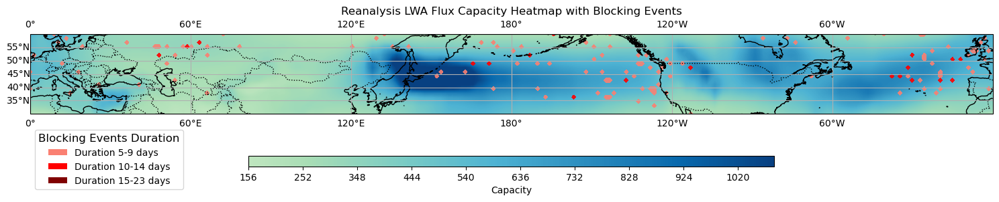

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load blocking events
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Vertically stack the arrays
blocking_data = np.vstack((data1, data2))

# Filter rows based on the month and year condition
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back to a NumPy array
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]

# Get durations from blocking data
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create different grids for different duration ranges
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Compute capacity array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Extract vmin and vmax from the capacity data based on 10th and 90th percentiles
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
print(vmin_val)
print(vmax_val)

# Clip the values of capacity to be within vmin_val and vmax_val
capacity = np.clip(capacity, vmin_val, vmax_val)

# Index the arrays to include only the latitude range from 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Set up the map with new latitude values
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the map
fig, ax = plt.subplots(figsize=(15, 7), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
ax.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot heatmap
cs = ax.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Define colors for different duration ranges
color_5_9 = 'salmon'
color_10_14 = 'red'
color_15_23 = 'maroon'

# Plot different blocking grids for the subset range
ax.contourf(lon, lat, blocking_grid_5_9_subset, levels=[0.5, 1.5], colors=[color_5_9], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_10_14_subset, levels=[0.5, 1.5], colors=[color_10_14], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_15_23_subset, levels=[0.5, 1.5], colors=[color_15_23], alpha=0.9, transform=ccrs.PlateCarree())

# Add gridlines
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Add colorbar, shortened and aligned to the right
cb = fig.colorbar(cs, ax=ax, orientation='horizontal', fraction=0.025, pad=0.1, aspect=50, anchor=(0.5, 1))
cb.set_label('Capacity')

# Place legend for blocking events at the bottom left, stacked vertically
legend_elements = [
    Patch(facecolor=color_5_9, label='Duration 5-9 days'),
    Patch(facecolor=color_10_14, label='Duration 10-14 days'),
    Patch(facecolor=color_15_23, label='Duration 15-23 days')
]
legend = ax.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0, -1), ncol=1, title='Blocking Events Duration')
plt.setp(legend.get_title(), fontsize='large')

# Adjust figure layout to fit legend and colorbar
fig.tight_layout(rect=[0, 0, 1, 1])  # Adjust the rect or use plt.subplots_adjust

# Set title and show the plot
ax.set_title(r'Reanalysis LWA Flux Capacity Heatmap with Blocking Events')
plt.show()

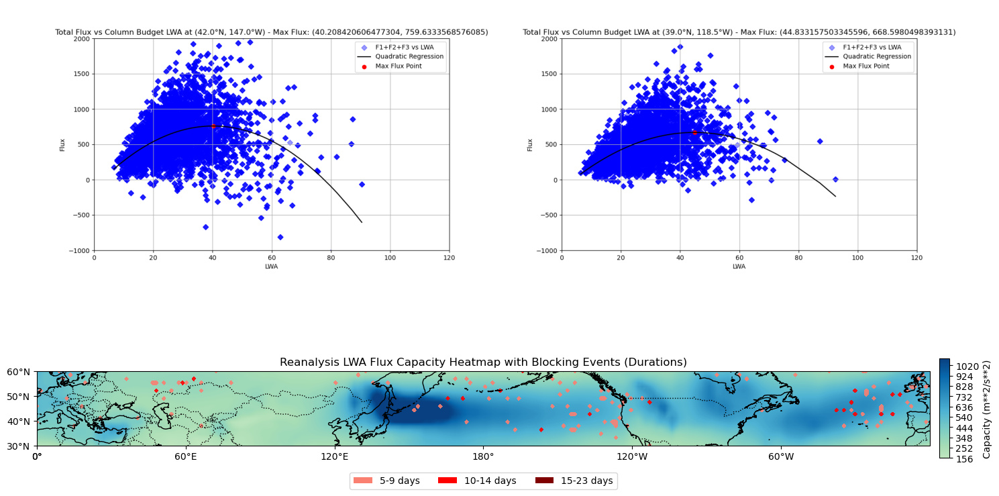

In [103]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)

# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1.2, 0.2], width_ratios=[1, 1])

# Load and display the first image in the first row, first column
ax1 = fig.add_subplot(gs[0, 0])
img1 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_42.0°N_147.0°W.png')
ax1.imshow(img1)
ax1.axis('off')  # Turn off axis labels

# Load and display the second image in the first row, second column
ax2 = fig.add_subplot(gs[0, 1])
img2 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_39.0°N_118.5°W.png')
ax2.imshow(img2)
ax2.axis('off')  # Turn off axis labels

# Set up the map for the second row that spans both columns
ax3 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree(central_longitude=180))
ax3.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=10)
cb.set_label('Capacity (m**2/s**2)')

# Add a legend for the blocking event durations
# legend_elements = [
#     Patch(facecolor='salmon', label='Duration 5-9 days'),
#     Patch(facecolor='red', label='Duration 10-14 days'),
#     Patch(facecolor='maroon', label='Duration 15-23 days')
# ]
# legend = ax3.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0, -1), ncol=1, title='Blocking Events Duration')
# plt.setp(legend.get_title(), fontsize='large')

legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title('Reanalysis LWA Flux Capacity Heatmap with Blocking Events (Durations)')

# Display the figure
plt.show()


In [ ]:
### poster only
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)

# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1.2, 0.2], width_ratios=[1, 1])

# Load and display the first image in the first row, first column
ax1 = fig.add_subplot(gs[0, 0])
img1 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_42.0°N_147.0°W.png')
ax1.imshow(img1)
ax1.axis('off')  # Turn off axis labels

# Load and display the second image in the first row, second column
ax2 = fig.add_subplot(gs[0, 1])
img2 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_39.0°N_118.5°W.png')
ax2.imshow(img2)
ax2.axis('off')  # Turn off axis labels

# Set up the map for the second row that spans both columns
ax3 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree(central_longitude=180))
ax3.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=10)
cb.set_label('Capacity (m**2/s**2)')

# Add a legend for the blocking event durations
# legend_elements = [
#     Patch(facecolor='salmon', label='Duration 5-9 days'),
#     Patch(facecolor='red', label='Duration 10-14 days'),
#     Patch(facecolor='maroon', label='Duration 15-23 days')
# ]
# legend = ax3.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0, -1), ncol=1, title='Blocking Events Duration')
# plt.setp(legend.get_title(), fontsize='large')

legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title('Reanalysis LWA Flux Capacity Heatmap with Blocking Events (Durations)')

# Display the figure
plt.show()


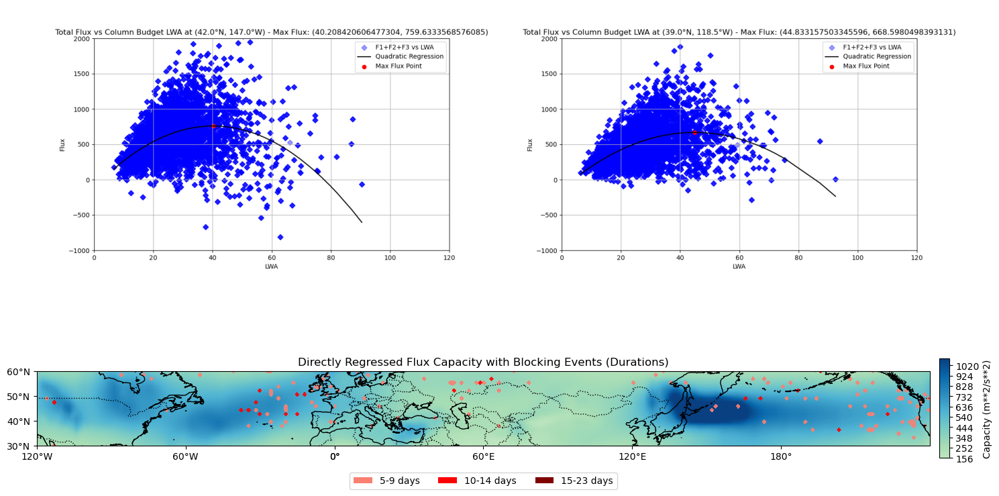

In [3]:
### 60E Center
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter 

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)

# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1.2, 0.2], width_ratios=[1, 1])

# Load and display the first image in the first row, first column
ax1 = fig.add_subplot(gs[0, 0])
img1 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_42.0°N_147.0°W.png')
ax1.imshow(img1)
ax1.axis('off')  # Turn off axis labels

# Load and display the second image in the first row, second column
ax2 = fig.add_subplot(gs[0, 1])
img2 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_39.0°N_118.5°W.png')
ax2.imshow(img2)
ax2.axis('off')  # Turn off axis labels

# Set up the map for the second row that spans both columns

ax3 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree(central_longitude=60))
ax3.set_extent([-120, 240, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')


# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=10)
cb.set_label('Capacity (m**2/s**2)')


legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title('Directly Regressed Flux Capacity with Blocking Events (Durations)')

# Display the figure
plt.show()


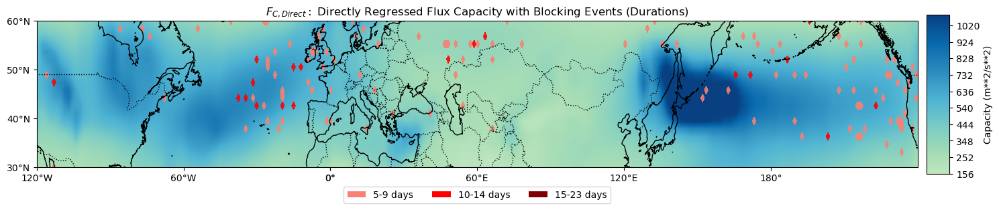

In [40]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)


# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))

gs = gridspec.GridSpec(1, 1)  # Simplified to a single plot

# Set up the map for the plot
ax3 = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree(central_longitude=60))
ax3.set_extent([-120, 240, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap using imshow
transform = ccrs.PlateCarree()  # Set the transformation
cmap = 'GnBu'  # Choose a colormap
heatmap = ax3.imshow(capacity_subset, extent=[-120, 240, 30, 60], transform=transform, cmap=cmap, origin='lower', aspect=2)


# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=7)
cb.set_label('Capacity (m**2/s**2)')


legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title(r'$F_{C, Direct}:$ Directly Regressed Flux Capacity with Blocking Events (Durations)')

# Display the figure
plt.show()



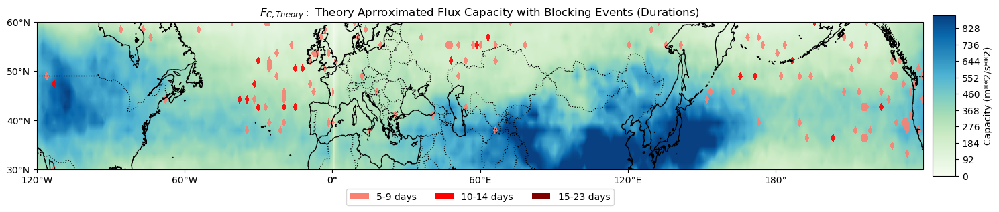

In [41]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation/NH18FluxCapacity.npy')

# Determine the min and max values for the capacity data
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)


# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))

gs = gridspec.GridSpec(1, 1)  # Simplified to a single plot

# Set up the map for the plot
ax3 = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree(central_longitude=60))
ax3.set_extent([-120, 240, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap using imshow
transform = ccrs.PlateCarree()  # Set the transformation
cmap = 'GnBu'  # Choose a colormap
heatmap = ax3.imshow(capacity_subset, extent=[-120, 240, 30, 60], transform=transform, cmap=cmap, origin='lower', aspect=2)


# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=7)
cb.set_label('Capacity (m**2/s**2)')


legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title(r'$F_{C, Theory}:$ Theory Aprroximated Flux Capacity with Blocking Events (Durations)')

# Display the figure
plt.show()



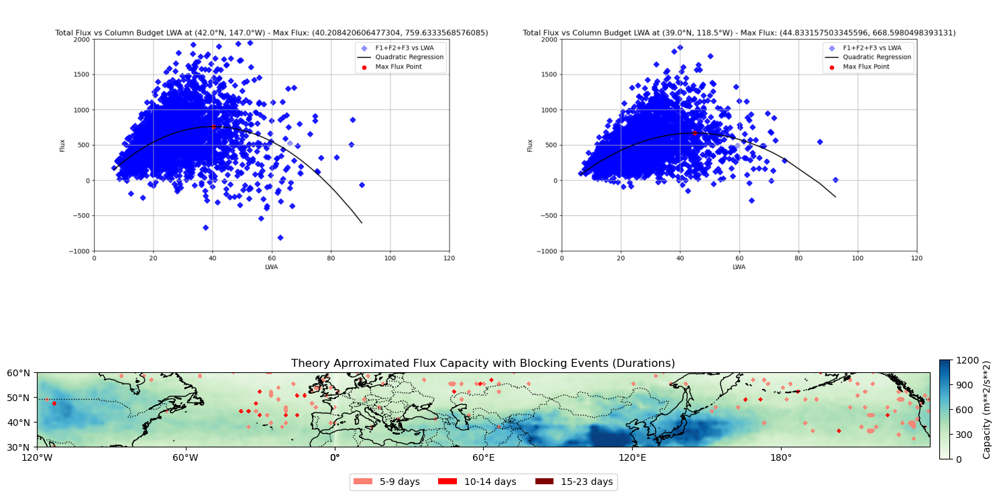

In [2]:
## AGU Pitch

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter 

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation/NH18FluxCapacity.npy')


# Determine the min and max values for the capacity data
vmin_val = 0
vmax_val = 1200

# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1.2, 0.2], width_ratios=[1, 1])

# Load and display the first image in the first row, first column
ax1 = fig.add_subplot(gs[0, 0])
img1 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_42.0°N_147.0°W.png')
ax1.imshow(img1)
ax1.axis('off')  # Turn off axis labels

# Load and display the second image in the first row, second column
ax2 = fig.add_subplot(gs[0, 1])
img2 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_39.0°N_118.5°W.png')
ax2.imshow(img2)
ax2.axis('off')  # Turn off axis labels

# Set up the map for the second row that spans both columns
ax3 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree(central_longitude=60))
ax3.set_extent([-120, 240, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
# 添加色标时设置特定的刻度
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=10, ticks=[0, 300, 600, 900, 1200])
cb.set_label('Capacity (m**2/s**2)')


legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title('Theory Aprroximated Flux Capacity with Blocking Events (Durations)')

# Display the figure
plt.show()


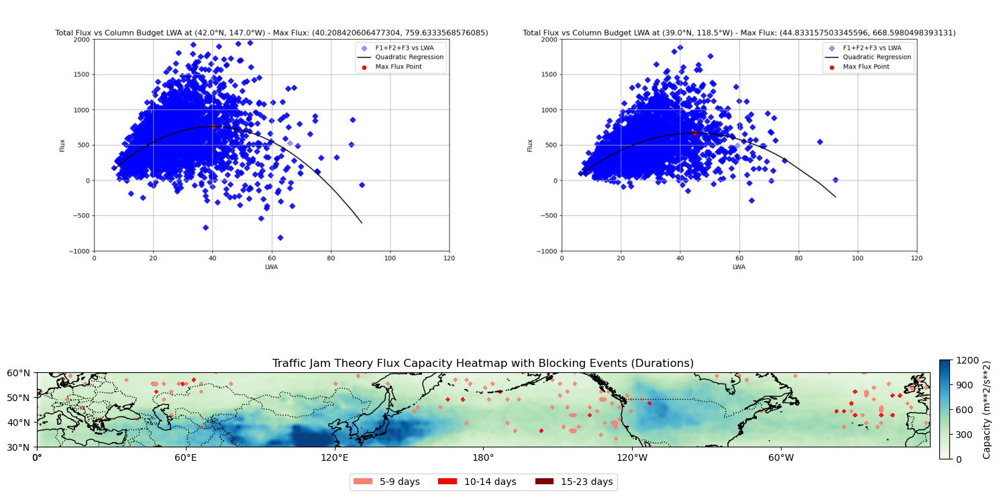

In [108]:
## AGU Pitch

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation/NH18FluxCapacity.npy')


# Determine the min and max values for the capacity data
vmin_val = 0
vmax_val = 1200

# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1.2, 0.2], width_ratios=[1, 1])

# Load and display the first image in the first row, first column
ax1 = fig.add_subplot(gs[0, 0])
img1 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_42.0°N_147.0°W.png')
ax1.imshow(img1)
ax1.axis('off')  # Turn off axis labels

# Load and display the second image in the first row, second column
ax2 = fig.add_subplot(gs[0, 1])
img2 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_39.0°N_118.5°W.png')
ax2.imshow(img2)
ax2.axis('off')  # Turn off axis labels

# Set up the map for the second row that spans both columns
ax3 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree(central_longitude=180))
ax3.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
# 添加色标时设置特定的刻度
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=10, ticks=[0, 300, 600, 900, 1200])
cb.set_label('Capacity (m**2/s**2)')


legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title('Traffic Jam Theory Flux Capacity Heatmap with Blocking Events (Durations)')

# Display the figure
plt.show()


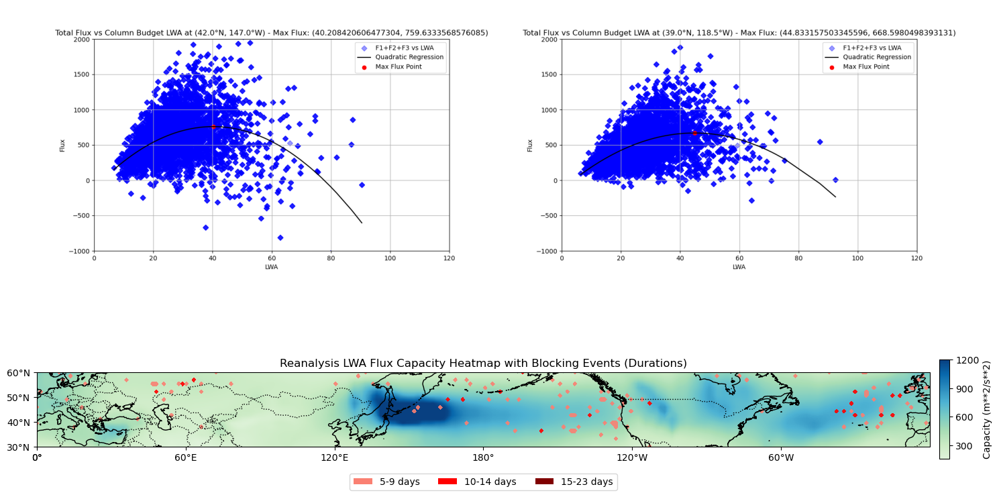

In [107]:
## Pitch
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# Load blocking event data
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Stack the data arrays vertically
blocking_data = np.vstack((data1, data2))

# Filter the data based on the specified month and year
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back into a NumPy array
blocking_data = np.array(filtered_blocking_data)

# Extract longitudes, latitudes, and durations from the blocking data
longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create grids for different duration ranges of blocking events
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

# Populate the grids with blocking event data
for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Load the capacity data array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Determine the min and max values for the capacity data
vmin_val = 0
vmax_val = 1200

# Clip the capacity values to lie within the determined min and max
capacity = np.clip(capacity, vmin_val, vmax_val)

# Select the index range corresponding to latitudes 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

# Subset the capacity and blocking grids to the selected latitude range
capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Define the latitude and longitude values for the subset
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the figure and gridspec layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1.2, 0.2], width_ratios=[1, 1])

# Load and display the first image in the first row, first column
ax1 = fig.add_subplot(gs[0, 0])
img1 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_42.0°N_147.0°W.png')
ax1.imshow(img1)
ax1.axis('off')  # Turn off axis labels

# Load and display the second image in the first row, second column
ax2 = fig.add_subplot(gs[0, 1])
img2 = plt.imread('/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/plot_39.0°N_118.5°W.png')
ax2.imshow(img2)
ax2.axis('off')  # Turn off axis labels

# Set up the map for the second row that spans both columns
ax3 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree(central_longitude=180))
ax3.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the capacity heatmap on the map
cs = ax3.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Plot the blocking event grids with corresponding colors
colors = ['salmon', 'red', 'maroon']
for grid, color in zip([blocking_grid_5_9_subset, blocking_grid_10_14_subset, blocking_grid_15_23_subset], colors):
    ax3.contourf(lon, lat, grid, levels=[0.5, 1.5], colors=[color], alpha=0.9, transform=ccrs.PlateCarree())

# Set axis labels for the map
ax3.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
ax3.set_yticks(np.arange(30, 61, 10), crs=ccrs.PlateCarree())
ax3.xaxis.set_major_formatter(LongitudeFormatter())
ax3.yaxis.set_major_formatter(LatitudeFormatter())
ax3.tick_params(labelsize=10)

# Add a colorbar for the capacity heatmap
# 添加色标时设置特定的刻度
cb = fig.colorbar(cs, ax=ax3, orientation='vertical', fraction=0.025, pad=0.01, aspect=10, ticks=[0, 300, 600, 900, 1200])
cb.set_label('Capacity (m**2/s**2)')


# Add a legend for the blocking event durations
# legend_elements = [
#     Patch(facecolor='salmon', label='Duration 5-9 days'),
#     Patch(facecolor='red', label='Duration 10-14 days'),
#     Patch(facecolor='maroon', label='Duration 15-23 days')
# ]
# legend = ax3.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0, -1), ncol=1, title='Blocking Events Duration')
# plt.setp(legend.get_title(), fontsize='large')

legend_elements = [
    Patch(facecolor='salmon', label='5-9 days'),
    Patch(facecolor='red', label='10-14 days'),
    Patch(facecolor='maroon', label='15-23 days')
]
# Place the legend at the center bottom of the figure
legend = ax3.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=3)

# Adjust the layout to fit the legend and colorbar
plt.tight_layout()

# Set the title for the map
ax3.set_title('Reanalysis LWA Flux Capacity Heatmap with Blocking Events (Durations)')

# Display the figure
plt.show()


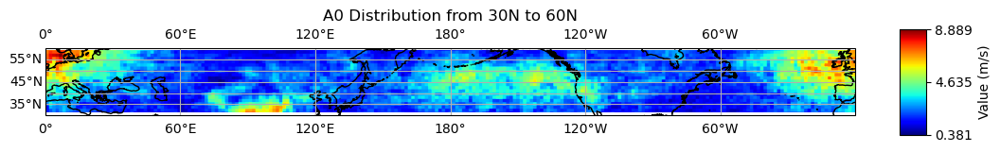

In [26]:
# load A_0 data

import numpy as np
import os
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Path to the saved .npy file
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(output_directory, "dist_of_A0_winter.npy")


# Load the array
A0 = np.load(file_path)
A0_subset = A0[80:101, :]

# Set up Cartopy with a PlateCarree projection
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

# Set the extent of the map to the area of interest (30N to 60N, and full longitude range)
ax.set_extent([0, 361, 30, 60], crs=ccrs.PlateCarree())

# Plot the data
heatmap = ax.imshow(A0_subset, extent=[0, 361, 30, 60], cmap='jet', origin='lower', transform=ccrs.PlateCarree())

# Add features and customization
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Place colorbar on the right, adjust its size and aspect to match the plot height
cbar = plt.colorbar(heatmap, ax=ax, orientation='vertical', fraction=0.03, pad=0.05, aspect=4)
cbar.set_label('Value (m/s)')

# Reduce the number of numerical labels on the colorbar
cbar.set_ticks(np.linspace(np.min(A0_subset), np.max(A0_subset), 3))

plt.title('A0 Distribution from 30N to 60N')

plt.show()

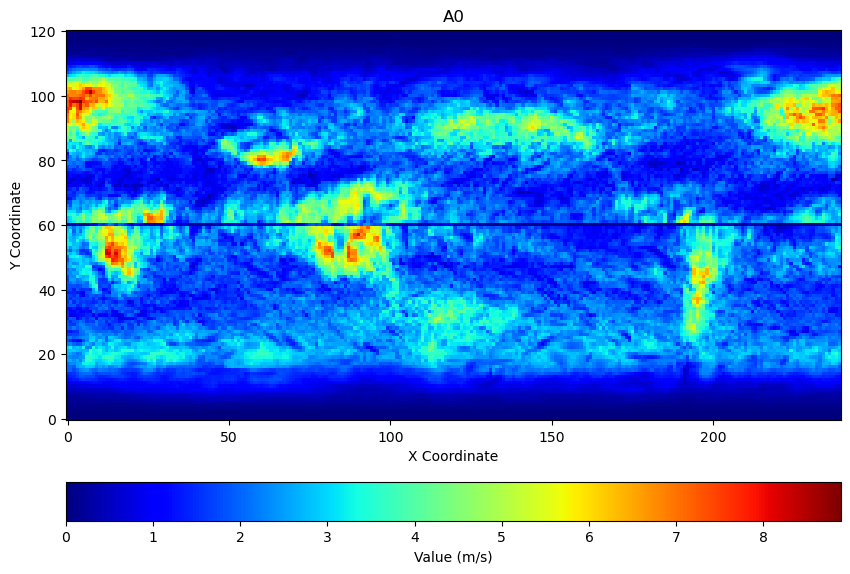

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Path to the saved .npy file
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(output_directory, "dist_of_A0_winter.npy")


# Load the array
A0 = np.load(file_path)
# Plot the heatmap
plt.figure(figsize=(10, 10))
plt.imshow(A0, cmap='jet', origin='lower', interpolation='nearest')  # Set cmap to 'jet' and origin to 'lower'
cbar = plt.colorbar(orientation='horizontal', pad=0.08)  
cbar.set_label('Value (m/s)')
plt.title('A0')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()



In [39]:
# Load \alpha data
import numpy as np
import os
save_folder = "/scratch/negishi/yan481/KenYan_Traffic_Model/alpha_regression_DJF"
file_path = os.path.join(save_folder, 'slope_data_djf.npy')
alpha_data_djf = np.load(file_path, allow_pickle=True)
print(alpha_data_djf)

[[        nan         nan         nan ...         nan         nan
          nan]
 [ 0.49809089  0.48589095  0.63510662 ...  0.57681243  0.5099657
   0.49827538]
 [-0.72671567 -0.74024931 -0.77557741 ... -0.63799475 -0.65136936
  -0.71635259]
 ...
 [-3.68451402 -3.65768062 -3.59540905 ... -3.81742273 -3.72808196
  -3.64019955]
 [-5.17874072 -5.06625368 -4.92587656 ... -5.55321683 -5.32093718
  -5.06039562]
 [        nan         nan         nan ...         nan         nan
          nan]]


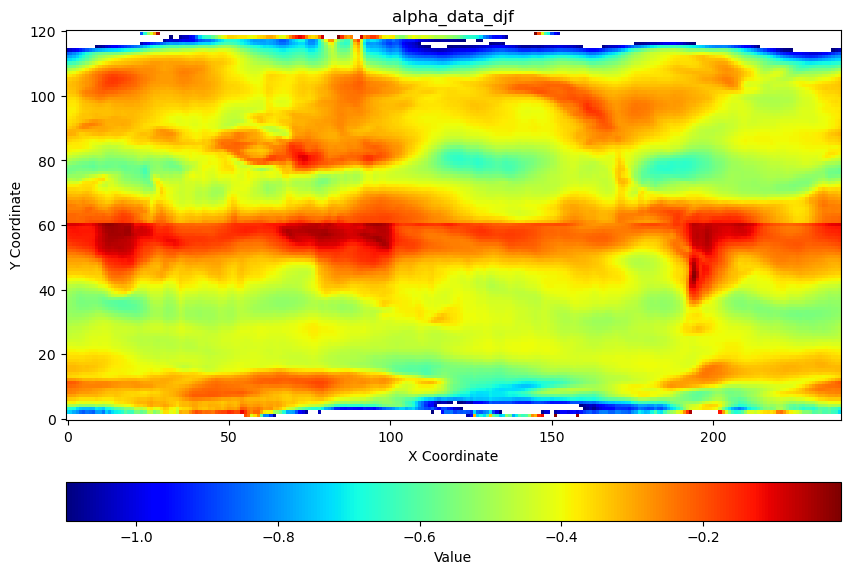

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import os


alpha_data_djf[(alpha_data_djf < -1.1) | (alpha_data_djf > -0)] = np.nan
# Plot the heatmap
plt.figure(figsize=(10, 10))
plt.imshow(alpha_data_djf, cmap='jet', origin='lower', interpolation='nearest')  # Set cmap to 'jet' and origin to 'lower'
cbar = plt.colorbar(orientation='horizontal', pad=0.08)  
cbar.set_label('Value')
plt.title('alpha_data_djf')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()



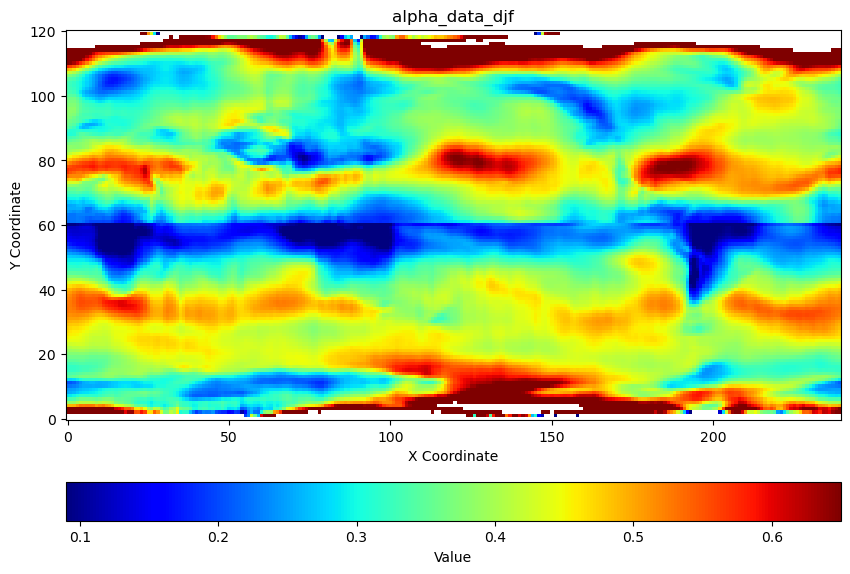

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import os


alpha_data_djf[(alpha_data_djf < -1.1) | (alpha_data_djf > -0)] = np.nan
# Plot the heatmap
plt.figure(figsize=(10, 10))
plt.imshow(-alpha_data_djf, cmap='jet', origin='lower', interpolation='nearest', vmin = 0.09, vmax = 0.65)  # Set cmap to 'jet' and origin to 'lower'
cbar = plt.colorbar(orientation='horizontal', pad=0.08)  
cbar.set_label('Value')
plt.title('alpha_data_djf')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

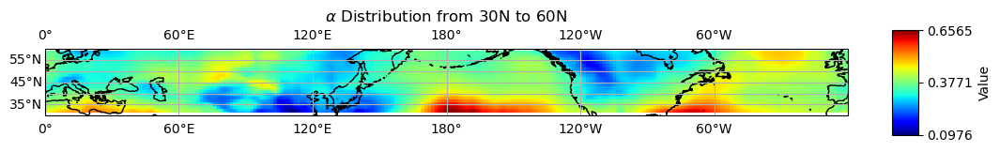

In [35]:
import numpy as np
import os
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Path to the saved .npy file
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/alpha_regression_DJF"
file_path = os.path.join(output_directory, "slope_data_djf.npy")


# Load the array
A0 = np.load(file_path)
A0_subset = -A0[80:101, :]

# Set up Cartopy with a PlateCarree projection
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

# Set the extent of the map to the area of interest (30N to 60N, and full longitude range)
ax.set_extent([0, 361, 30, 60], crs=ccrs.PlateCarree())

# Plot the data
heatmap = ax.imshow(A0_subset, extent=[0, 361, 30, 60], cmap='jet', origin='lower', transform=ccrs.PlateCarree())

# Add features and customization
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Place colorbar on the right, adjust its size and aspect to match the plot height
cbar = plt.colorbar(heatmap, ax=ax, orientation='vertical', fraction=0.03, pad=0.05, aspect=4)
cbar.set_label('Value')

# Reduce the number of numerical labels on the colorbar
cbar.set_ticks(np.linspace(np.min(A0_subset), np.max(A0_subset), 3))

plt.title(r'$\alpha$ Distribution from 30N to 60N')


plt.show()

In [41]:
# Element-wise (pixel by pixel) multiplication
product_data = A0 * alpha_data_djf

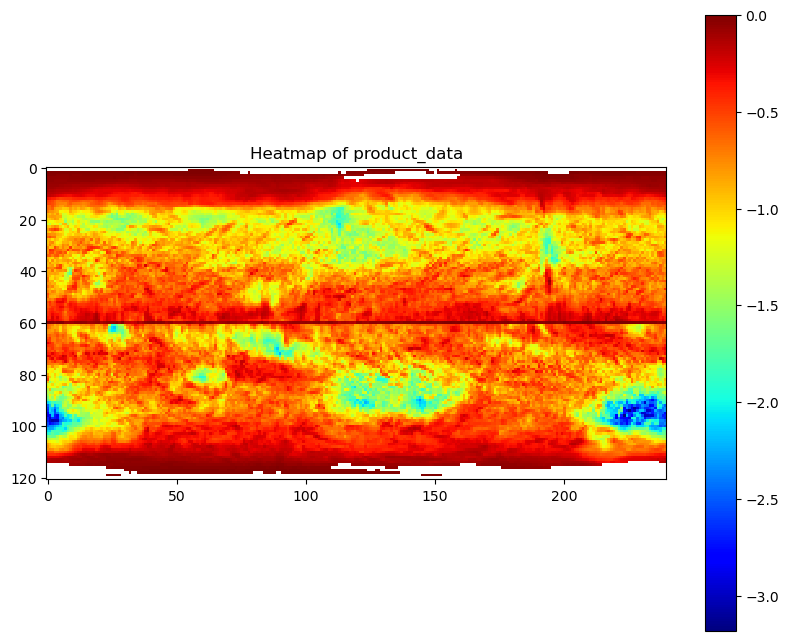

In [42]:
import numpy as np
import matplotlib.pyplot as plt



# Plotting
plt.figure(figsize=(10,8))
plt.imshow(product_data, cmap='jet', interpolation='none')
plt.colorbar()
plt.title('Heatmap of product_data')
plt.show()


In [43]:
import numpy as np

# Set the path to the saved .npy file
directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(directory, "time_averaged_column_Uref_DJF.npy")

# Load the array
time_averaged_Uref = np.load(file_path)

# Print shape or some initial values to confirm
print(time_averaged_Uref.shape)
print(time_averaged_Uref[:5,:5])  # prints first 5x5 block of the loaded data

(121, 240)
[[1.09413344e-16 1.09413344e-16 1.09413344e-16 1.09413344e-16
  1.09413344e-16]
 [1.05555993e-01 1.05555993e-01 1.05555993e-01 1.05555993e-01
  1.05555993e-01]
 [3.28562494e-01 3.28562494e-01 3.28562494e-01 3.28562494e-01
  3.28562494e-01]
 [5.83799101e-01 5.83799101e-01 5.83799101e-01 5.83799101e-01
  5.83799101e-01]
 [8.40828648e-01 8.40828648e-01 8.40828648e-01 8.40828648e-01
  8.40828648e-01]]


In [44]:
# Set the path to the saved .npy file
directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(directory, "reduced_Cg.npy")

# Load the array
reduced_Cg = np.load(file_path)

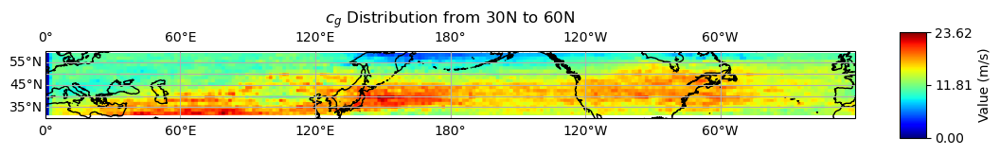

In [37]:
import numpy as np
import os
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Path to the saved .npy file
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(output_directory, "reduced_Cg.npy")


# Load the array
A0 = np.load(file_path)
A0_subset = A0[80:101, :]

# Set up Cartopy with a PlateCarree projection
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

# Set the extent of the map to the area of interest (30N to 60N, and full longitude range)
ax.set_extent([0, 361, 30, 60], crs=ccrs.PlateCarree())

# Plot the data
heatmap = ax.imshow(A0_subset, extent=[0, 361, 30, 60], cmap='jet', origin='lower', transform=ccrs.PlateCarree())

# Add features and customization
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Place colorbar on the right, adjust its size and aspect to match the plot height
cbar = plt.colorbar(heatmap, ax=ax, orientation='vertical', fraction=0.03, pad=0.05, aspect=4)
cbar.set_label('Value (m/s)')

# Reduce the number of numerical labels on the colorbar
cbar.set_ticks(np.linspace(np.min(A0_subset), np.max(A0_subset), 3))

plt.title(r'$c_g$ Distribution from 30N to 60N')


plt.show()

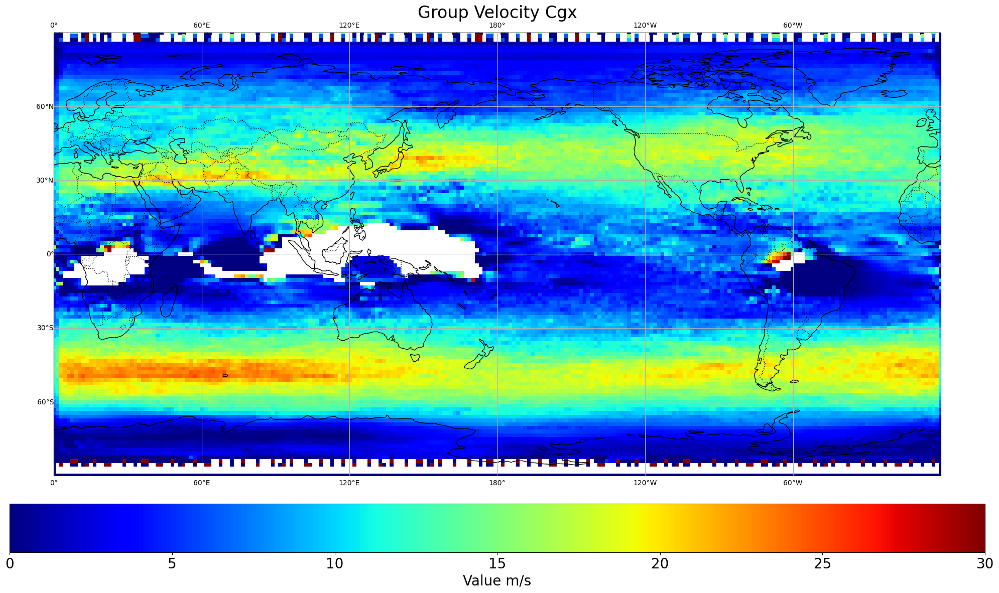

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import cartopy.crs as ccrs
import cartopy.feature as cfeature

new_lats = np.linspace(-90, 90, 121)
new_lons = np.linspace(0, 360, 240)

fig, ax = plt.subplots(figsize=(20, 12), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
color_min = 0
color_max = 30
cs = ax.pcolormesh(new_lons, new_lats, reduced_Cg, cmap='jet', transform=ccrs.PlateCarree(), vmin=color_min, vmax=color_max)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_global()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.set_title("Group Velocity Cgx", fontsize=24)

cbar = fig.colorbar(cs, ax=ax, orientation='horizontal', shrink=1, pad=0.05)
cbar.set_label('Value m/s', size = 20)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
plt.show()

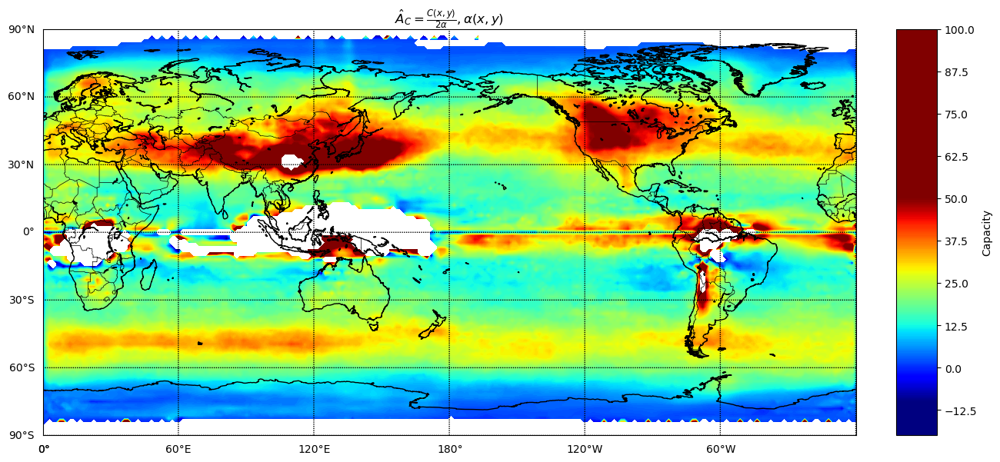

In [10]:
import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array
capacity = reduced_Cg + time_averaged_Uref + 2 * product_data


# Divide capacity by alpha_data
capacity /= (-2*alpha_data_djf)

capacity[(capacity < -20) | (capacity > 100)] = np.nan


# Extract vmin and vmax from the capacity data
vmin_val = -10
vmax_val = 50

# Mask out values in capacity where absolute value of alpha_data is less than 0.05
masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 7))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256, vmin=vmin_val, vmax=vmax_val)

# Plot white contours for the masked regions
mask_contour = np.abs(alpha_data_djf) < 0.01
m.contour(lon, lat, mask_contour, colors="white", latlon=True)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", boundaries=np.linspace(vmin_val, vmax_val, 256))
cb.set_label('Capacity')

plt.title(r'$\hat{A}_C = \frac{C(x,y)}{2\alpha}, \alpha(x,y)$')

plt.show()






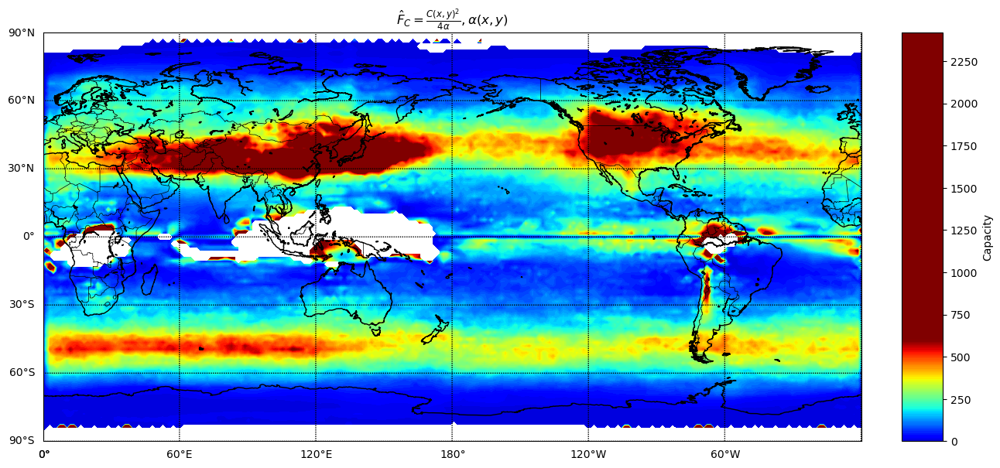

In [11]:
import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array
capacity = (reduced_Cg + time_averaged_Uref + 2 * product_data) ** 2


# Divide capacity by alpha_data
capacity /= (-4 * alpha_data_djf)
capacity[(capacity < -100) | (capacity > 2500)] = np.nan


# Extract vmin and vmax from the capacity data
vmin_val = -50
vmax_val = 600

# Mask out values in capacity where absolute value of alpha_data is less than 0.05
# masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)
masked_capacity = capacity

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 9))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256, vmin=vmin_val, vmax=vmax_val)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", extend='both')
cb.set_label('Capacity')

plt.title(r'$\hat{F}_C = \frac{C(x,y)^2}{4\alpha}, \alpha(x,y)$')

plt.show()



# Convert masked_capacity to a regular ndarray, filling masked values with np.nan
regular_capacity_array = np.ma.filled(masked_capacity, np.nan)

# Directory where you want to save the file
save_dir = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"


# File path where the data will be saved
file_path = os.path.join(save_dir, "NH18FluxCapacity.npy")

# Save the regular_capacity_array array
np.save(file_path, regular_capacity_array)


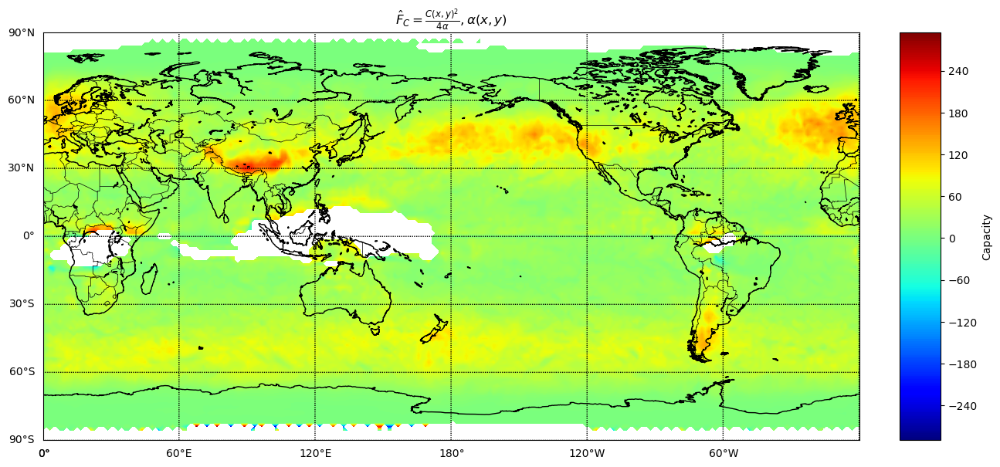

In [12]:
# stationary flux

import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array
capacity = (reduced_Cg + time_averaged_Uref + A0 * alpha_data_djf) * A0 


# Mask out values in capacity where absolute value of alpha_data is less than 0.05
# masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)
masked_capacity = capacity

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 9))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", extend='both')
cb.set_label('Capacity')

plt.title(r'$\hat{F}_C = \frac{C(x,y)^2}{4\alpha}, \alpha(x,y)$')

plt.show()


# Convert masked_capacity to a regular ndarray, filling masked values with np.nan
regular_capacity_array = np.ma.filled(masked_capacity, np.nan)

# Directory where you want to save the file
save_dir = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"


# File path where the data will be saved
file_path = os.path.join(save_dir, "Stationary_Flux_NH18.npy")

# Save the regular_capacity_array array
np.save(file_path, regular_capacity_array)


(181, 360)


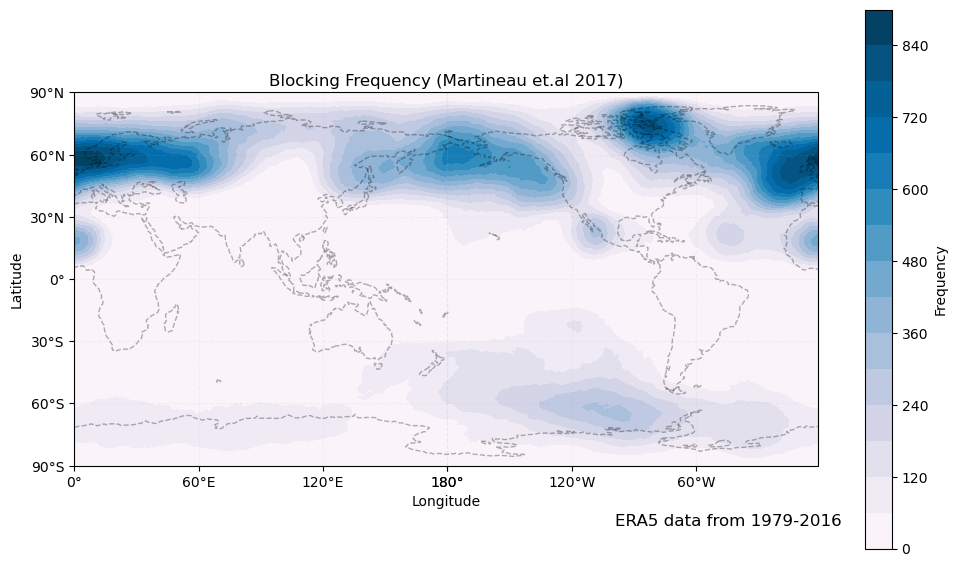

In [71]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Wed Oct 11 17:23:54 2023

@author: kaying
"""

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter 

import numpy as np
NH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0NH.npy")
SH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0SH.npy")
BlockingFreq = NH+SH


Plot = BlockingFreq
Lat = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lat.npy")
Lon = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lon.npy")
Period = "from 1979-2016"
levs = 15
fig = plt.figure(figsize=[12,7])

ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(central_longitude=180))

plt.contourf(Lon, Lat,Plot, levs,transform=ccrs.PlateCarree(),  cmap='PuBu')


ax.coastlines(linestyle="--", alpha=0.3)
ax.gridlines(linestyle="--", alpha=0.1)
ax.set_xticks([-180,-120,-60,0,60,120,180],crs=ccrs.PlateCarree())
ax.set_yticks([-90,-60,-30,0,30,60,90], crs=ccrs.PlateCarree())
lon_formatter = LongitudeFormatter(transform_precision = 1,zero_direction_label=False)
lat_formatter = LatitudeFormatter()
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)
cb=plt.colorbar()

cb.set_label('Frequency')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Blocking Frequency (Martineau et.al 2017)', pad=5)

plt.suptitle('ERA5 data '+str(Period), x=0.67,y=0.16)
print(BlockingFreq.shape)



(31, 360)


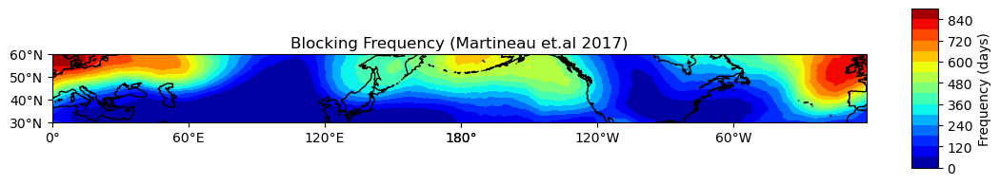

In [82]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Wed Oct 11 17:23:54 2023

@author: kaying
"""

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter 

import numpy as np
NH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0NH.npy")
SH = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/Blockingfrequency4.0SH.npy")
BlockingFreq = NH+SH

# Latitude and Longitude data
Lat = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lat.npy")
Lon = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/ERA5_lon.npy")

# Filter out the latitudes that are outside of 30N to 60N
lat_indices = np.where((Lat >= 30) & (Lat <= 60))[0]
Lat = Lat[lat_indices]
BlockingFreq = BlockingFreq[lat_indices, :]

Period = "from 1979-2016"
levs = 15
fig = plt.figure(figsize=[12,7])

ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(central_longitude=180))

# plt.contourf(Lon, Lat, BlockingFreq, levs, transform=ccrs.PlateCarree(), cmap='PuBu')
plt.contourf(Lon, Lat, BlockingFreq, levs, transform=ccrs.PlateCarree(), cmap='jet')

ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
ax.set_yticks([30, 40, 50, 60], crs=ccrs.PlateCarree())  # Set yticks to only show 30N to 60N
lon_formatter = LongitudeFormatter(transform_precision=1, zero_direction_label=False)
lat_formatter = LatitudeFormatter()

# Add features and customization
ax.coastlines()
# ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)


ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)
cb = plt.colorbar(orientation='vertical', fraction=0.03, pad=0.05, aspect=6)

cb.set_label('Frequency (days)')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
plt.title('Blocking Frequency (Martineau et.al 2017)', pad=5)

# plt.suptitle('ERA5 data ' + str(Period), x=0.67, y=0.16)
print(BlockingFreq.shape)


-230.39701800650838
1082.6418583584411


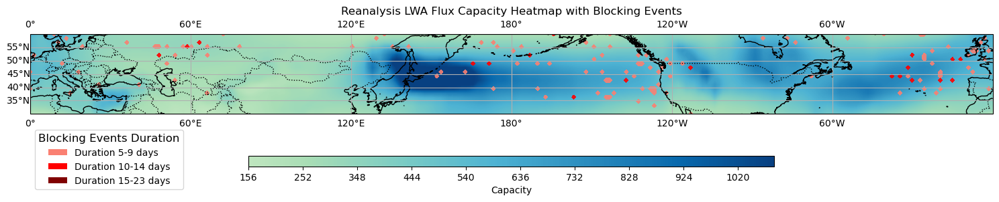

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load blocking events
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Vertically stack the arrays
blocking_data = np.vstack((data1, data2))

# Filter rows based on the month and year condition
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back to a NumPy array
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]

# Get durations from blocking data
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create different grids for different duration ranges
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Compute capacity array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Flux_Capacity.npy')

# Extract vmin and vmax from the capacity data based on 10th and 90th percentiles
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
print(vmin_val)
print(vmax_val)

# Clip the values of capacity to be within vmin_val and vmax_val
capacity = np.clip(capacity, vmin_val, vmax_val)

# Index the arrays to include only the latitude range from 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Set up the map with new latitude values
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the map
fig, ax = plt.subplots(figsize=(15, 7), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
ax.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot heatmap
cs = ax.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Define colors for different duration ranges
color_5_9 = 'salmon'
color_10_14 = 'red'
color_15_23 = 'maroon'

# Plot different blocking grids for the subset range
ax.contourf(lon, lat, blocking_grid_5_9_subset, levels=[0.5, 1.5], colors=[color_5_9], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_10_14_subset, levels=[0.5, 1.5], colors=[color_10_14], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_15_23_subset, levels=[0.5, 1.5], colors=[color_15_23], alpha=0.9, transform=ccrs.PlateCarree())

# Add gridlines
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Add colorbar, shortened and aligned to the right
cb = fig.colorbar(cs, ax=ax, orientation='horizontal', fraction=0.025, pad=0.1, aspect=50, anchor=(0.5, 1))
cb.set_label('Capacity')

# Place legend for blocking events at the bottom left, stacked vertically
legend_elements = [
    Patch(facecolor=color_5_9, label='Duration 5-9 days'),
    Patch(facecolor=color_10_14, label='Duration 10-14 days'),
    Patch(facecolor=color_15_23, label='Duration 15-23 days')
]
legend = ax.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0, -1), ncol=1, title='Blocking Events Duration')
plt.setp(legend.get_title(), fontsize='large')

# Adjust figure layout to fit legend and colorbar
fig.tight_layout(rect=[0, 0, 1, 1])  # Adjust the rect or use plt.subplots_adjust

# Set title and show the plot
ax.set_title(r'Reanalysis LWA Flux Capacity Heatmap with Blocking Events')
plt.show()

0.7858498645689393
899.3641347580404


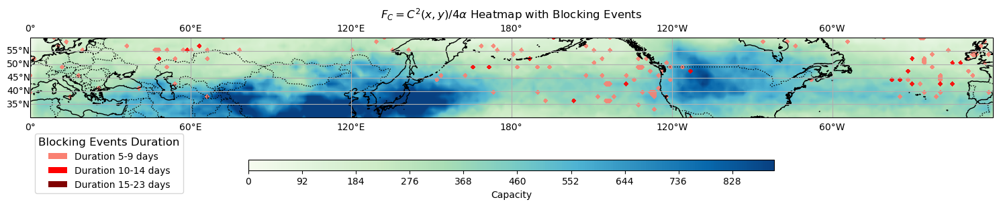

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load blocking events
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Vertically stack the arrays
blocking_data = np.vstack((data1, data2))

# Filter rows based on the month and year condition
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back to a NumPy array
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]

# Get durations from blocking data
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create different grids for different duration ranges
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Compute capacity array
capacity = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation/NH18FluxCapacity.npy')

# Extract vmin and vmax from the capacity data based on 10th and 90th percentiles
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
print(vmin_val)
print(vmax_val)

# Clip the values of capacity to be within vmin_val and vmax_val
capacity = np.clip(capacity, vmin_val, vmax_val)

# Index the arrays to include only the latitude range from 30N to 60N
lat_indices = np.arange(int((30 + 90) * 121 / 180), int((60 + 90) * 121 / 180))

capacity_subset = capacity[lat_indices, :]
blocking_grid_5_9_subset = blocking_grid_5_9[lat_indices, :]
blocking_grid_10_14_subset = blocking_grid_10_14[lat_indices, :]
blocking_grid_15_23_subset = blocking_grid_15_23[lat_indices, :]

# Set up the map with new latitude values
lat_vals = np.linspace(30, 60, len(lat_indices))
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

# Set up the map
fig, ax = plt.subplots(figsize=(15, 7), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
ax.set_extent([0, 360, 30, 60], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot heatmap
cs = ax.contourf(lon, lat, capacity_subset, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Define colors for different duration ranges
color_5_9 = 'salmon'
color_10_14 = 'red'
color_15_23 = 'maroon'

# Plot different blocking grids for the subset range
ax.contourf(lon, lat, blocking_grid_5_9_subset, levels=[0.5, 1.5], colors=[color_5_9], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_10_14_subset, levels=[0.5, 1.5], colors=[color_10_14], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_15_23_subset, levels=[0.5, 1.5], colors=[color_15_23], alpha=0.9, transform=ccrs.PlateCarree())

# Add gridlines
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Add colorbar, shortened and aligned to the right
cb = fig.colorbar(cs, ax=ax, orientation='horizontal', fraction=0.025, pad=0.1, aspect=50, anchor=(0.5, 1))
cb.set_label('Capacity')

# Place legend for blocking events at the bottom left, stacked vertically
legend_elements = [
    Patch(facecolor=color_5_9, label='Duration 5-9 days'),
    Patch(facecolor=color_10_14, label='Duration 10-14 days'),
    Patch(facecolor=color_15_23, label='Duration 15-23 days')
]
legend = ax.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0, -1), ncol=1, title='Blocking Events Duration')
plt.setp(legend.get_title(), fontsize='large')

# Adjust figure layout to fit legend and colorbar
fig.tight_layout(rect=[0, 0, 1, 1])  # Adjust the rect or use plt.subplots_adjust

# Set title and show the plot
ax.set_title(r'$F_C = C^2(x,y) / 4 \alpha$ Heatmap with Blocking Events')
plt.show()

0.7903326396090815
1126.9467902191473


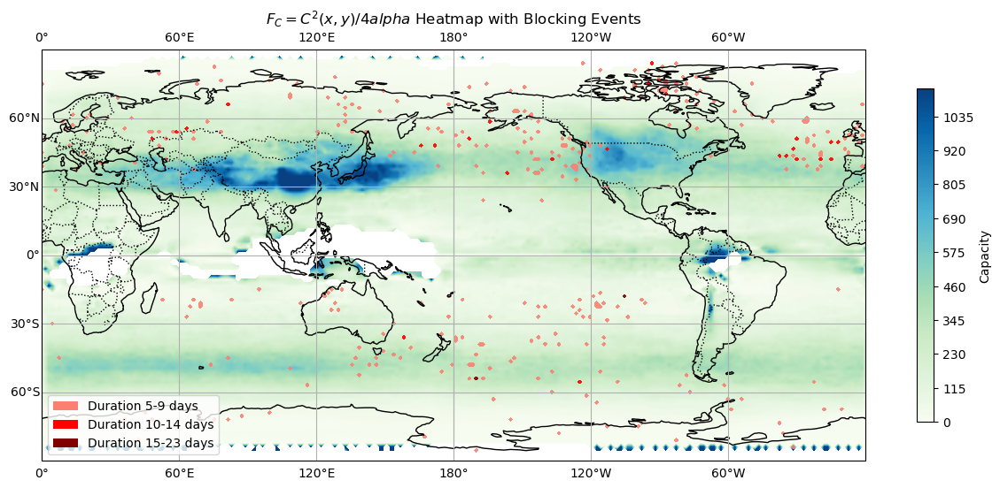

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load blocking events
data1 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load('/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/BlockingEventDate4.0SH.npy', allow_pickle=True)

# Vertically stack the arrays
blocking_data = np.vstack((data1, data2))

# Filter rows based on the month and year condition
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back to a NumPy array
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]

# Get durations from blocking data
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create different grids for different duration ranges
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Compute capacity array
capacity = (reduced_Cg + time_averaged_Uref + 2 * product_data) ** 2


# Divide capacity by alpha_data
capacity /= (-4 * alpha_data_djf)

# Extract vmin and vmax from the capacity data based on 10th and 90th percentiles
vmin_val = np.nanpercentile(capacity, 1)
vmax_val = np.nanpercentile(capacity, 99)
print(vmin_val)
print(vmax_val)

# Clip the values of capacity to be within vmin_val and vmax_val
capacity = np.clip(capacity, vmin_val, vmax_val)

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)
lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 7), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
ax.set_extent([0, 360, -90, 90], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot heatmap
cs = ax.contourf(lon, lat, capacity, cmap='GnBu', levels=256, vmin=vmin_val, vmax=vmax_val, transform=ccrs.PlateCarree())

# Define colors for different duration ranges
color_5_9 = 'salmon'
color_10_14 = 'red'
color_15_23 = 'maroon'

# Plot different blocking grids
ax.contourf(lon, lat, blocking_grid_5_9, levels=[0.5, 1.5], colors=[color_5_9], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_10_14, levels=[0.5, 1.5], colors=[color_10_14], alpha=0.9, transform=ccrs.PlateCarree())
ax.contourf(lon, lat, blocking_grid_15_23, levels=[0.5, 1.5], colors=[color_15_23], alpha=0.9, transform=ccrs.PlateCarree())

# Add gridlines
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# Add colorbar
cb = fig.colorbar(cs, ax=ax, orientation='vertical', shrink=0.7, pad=0.05)
cb.set_label('Capacity')

# Legend for blocking events
legend_elements = [
    Patch(facecolor=color_5_9, label='Duration 5-9 days'),
    Patch(facecolor=color_10_14, label='Duration 10-14 days'),
    Patch(facecolor=color_15_23, label='Duration 15-23 days')
]
ax.legend(handles=legend_elements, loc='lower left')
ax.set_title('$F_C = C^2(x,y) / 4 alpha$ Heatmap with Blocking Events')

plt.show()



3.890680564476229 400.54888823028165


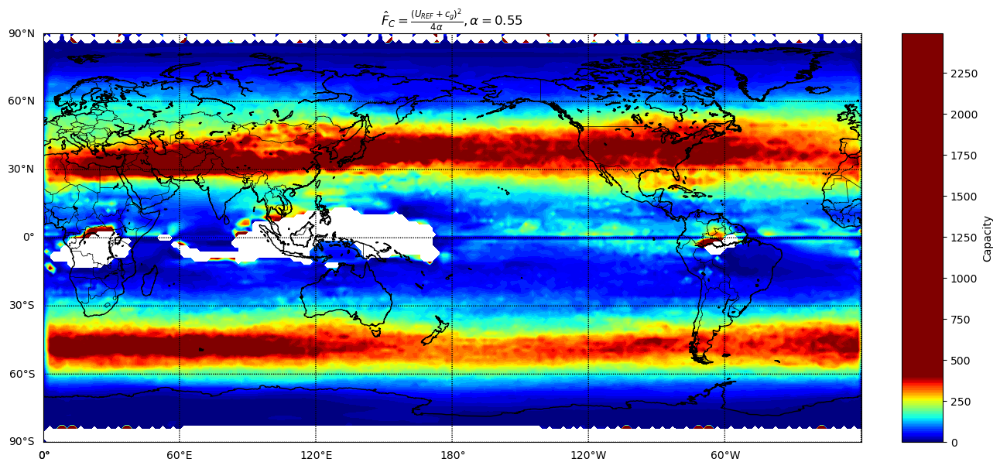

In [14]:
import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array
capacity = (reduced_Cg + time_averaged_Uref) ** 2


# Divide capacity by alpha_data
capacity /= 2.2
capacity[(capacity < -100) | (capacity > 2500)] = np.nan



# Mask out values in capacity where absolute value of alpha_data is less than 0.05
# masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)
masked_capacity = capacity

vmin = np.percentile(capacity[~np.isnan(capacity)], 5)
vmax = np.percentile(capacity[~np.isnan(capacity)], 95)
print(vmin, vmax)

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 9))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256, vmin=vmin, vmax=vmax)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", extend='both')
cb.set_label('Capacity')

plt.title(r'$\hat{F}_C = \frac{(U_{REF}+c_g)^2}{4\alpha}, \alpha = 0.55$')

plt.show()



# Convert masked_capacity to a regular ndarray, filling masked values with np.nan
regular_capacity_array = np.ma.filled(masked_capacity, np.nan)

# Directory where you want to save the file
save_dir = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"


# File path where the data will be saved
file_path = os.path.join(save_dir, "NH18FluxCapacity_USub1.npy")

# Save the regular_capacity_array array
np.save(file_path, regular_capacity_array)


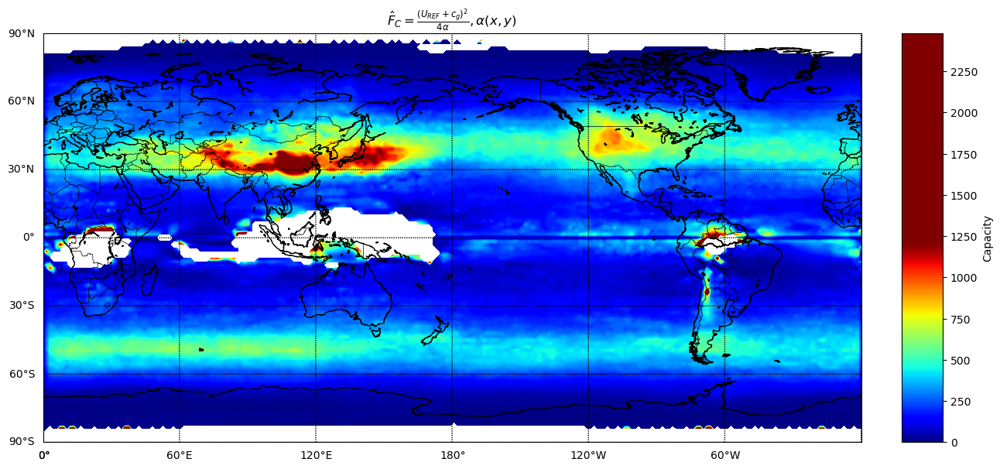

In [15]:
import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array
capacity = (reduced_Cg + time_averaged_Uref) ** 2


# Divide capacity by alpha_data
capacity /= (-4 * alpha_data_djf)
capacity[(capacity < -100) | (capacity > 2500)] = np.nan


# Extract vmin and vmax from the capacity data
vmin_val = 0
vmax_val = 1200

# Mask out values in capacity where absolute value of alpha_data is less than 0.05
# masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)
masked_capacity = capacity

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 9))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256, vmin=vmin_val, vmax=vmax_val)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", extend='both')
cb.set_label('Capacity')

plt.title(r'$\hat{F}_C = \frac{(U_{REF}+c_g)^2}{4\alpha}, \alpha(x,y)$')

plt.show()



# Convert masked_capacity to a regular ndarray, filling masked values with np.nan
regular_capacity_array = np.ma.filled(masked_capacity, np.nan)

# Directory where you want to save the file
save_dir = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"


# File path where the data will be saved
file_path = os.path.join(save_dir, "NH18FluxCapacity_USub.npy")

# Save the regular_capacity_array array
np.save(file_path, regular_capacity_array)


In [16]:
# load u_0 data

import numpy as np
import os

# Path to the saved .npy file
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(output_directory, "dist_of_zonal_wind_u_mean_winter.npy")

# Load the array
u0 = np.load(file_path)
print(u0.shape)

(121, 240)


In [17]:

import numpy as np
import os

# Path to the saved .npy file
output_directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/hn2016-falwa_calculation"
file_path = os.path.join(output_directory, "dist_of_A0_mean_winter.npy")

# Load the array
Amean = np.load(file_path)
print(Amean.shape)

(121, 240)


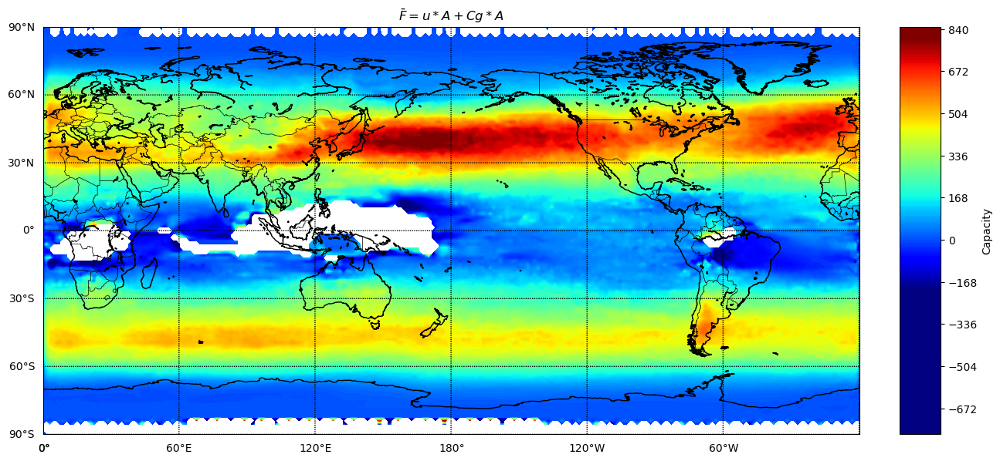

In [18]:
import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array: F = u*A +Cg*A
# F = (Uref+Cg)^2/4alpha
capacity = (u0 +reduced_Cg) * Amean

# capacity /= (-4 * alpha_data_djf)

# Extract vmin and vmax from the capacity data
vmin_val = -200
vmax_val = 800

# Mask out values in capacity where absolute value of alpha_data is less than 0.05
masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 9))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256, vmin=vmin_val, vmax=vmax_val)
# cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256)

# # Plot white contours for the masked regions
# mask_contour = np.abs(alpha_data) < 0.05
# m.contour(lon, lat, mask_contour, colors="white", latlon=True)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", extend='both')
cb.set_label('Capacity')

plt.title(r'$\bar{F} = u*A +Cg*A$')

plt.show()




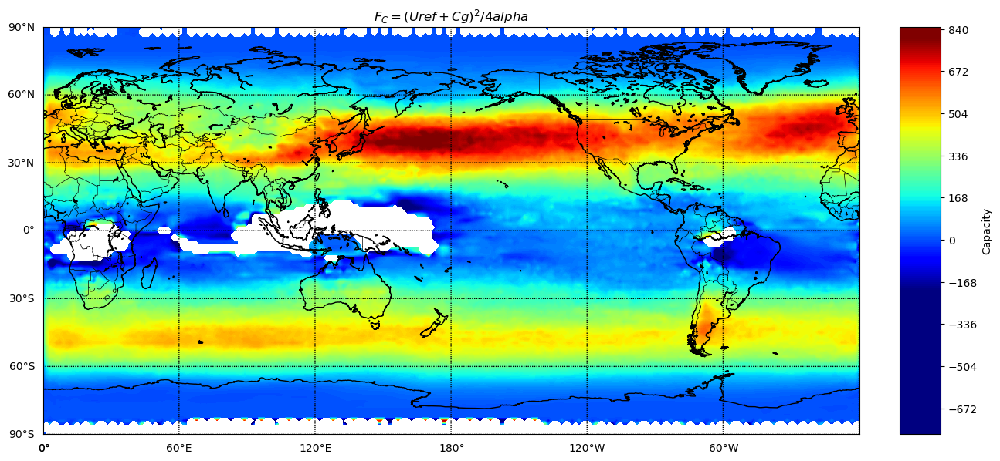

In [19]:
import numpy as np
import os
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt


# Compute capacity array: F = u*A +Cg*A
# F = (Uref+Cg)^2/4alpha
capacity = (reduced_Cg +time_averaged_Uref) ** 2

capacity /= (-4 * alpha_data_djf)

# Extract vmin and vmax from the capacity data
vmin_val = -200
vmax_val = 800

# Mask out values in capacity where absolute value of alpha_data is less than 0.05
# masked_capacity = np.ma.masked_where(np.abs(alpha_data_djf) < 0.01, capacity)
masked_capcity = capacity

# Set up the map
lat_vals = np.linspace(-90, 90, 121)
lon_vals = np.linspace(0, 360, 240)

lon, lat = np.meshgrid(lon_vals, lat_vals)

fig, ax = plt.subplots(figsize=(15, 9))

m = Basemap(projection='cyl', resolution='l', llcrnrlon=0, urcrnrlon=360, llcrnrlat=-90, urcrnrlat=90, ax=ax)
m.drawcoastlines()
m.drawcountries()
m.drawparallels(np.arange(-90,91,30), labels=[1,0,0,0])
m.drawmeridians(np.arange(0,361,60), labels=[0,0,0,1])

# Plot the masked array and set the colormap to 'jet'
cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256, vmin=vmin_val, vmax=vmax_val)
# cs = m.contourf(lon, lat, masked_capacity, cmap='jet', latlon=True, levels=256)

# # Plot white contours for the masked regions
# mask_contour = np.abs(alpha_data) < 0.05
# m.contour(lon, lat, mask_contour, colors="white", latlon=True)

# Add colorbar
cb = m.colorbar(cs, location='right', pad="5%", extend='both')
cb.set_label('Capacity')

plt.title(r'$F_C = (Uref+Cg)^2/4alpha$')

plt.show()




-1.5310503734525565
1.6840157883140654


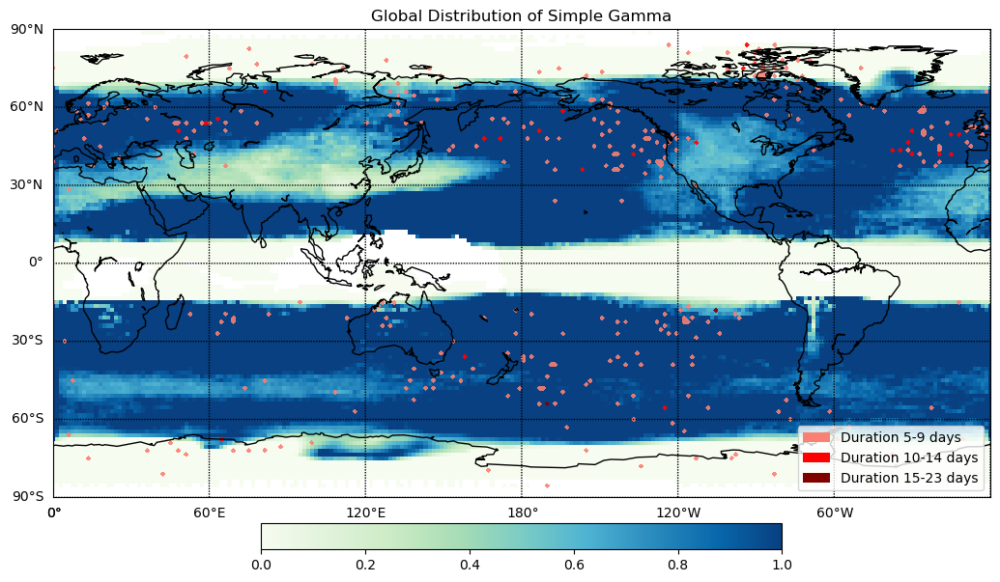

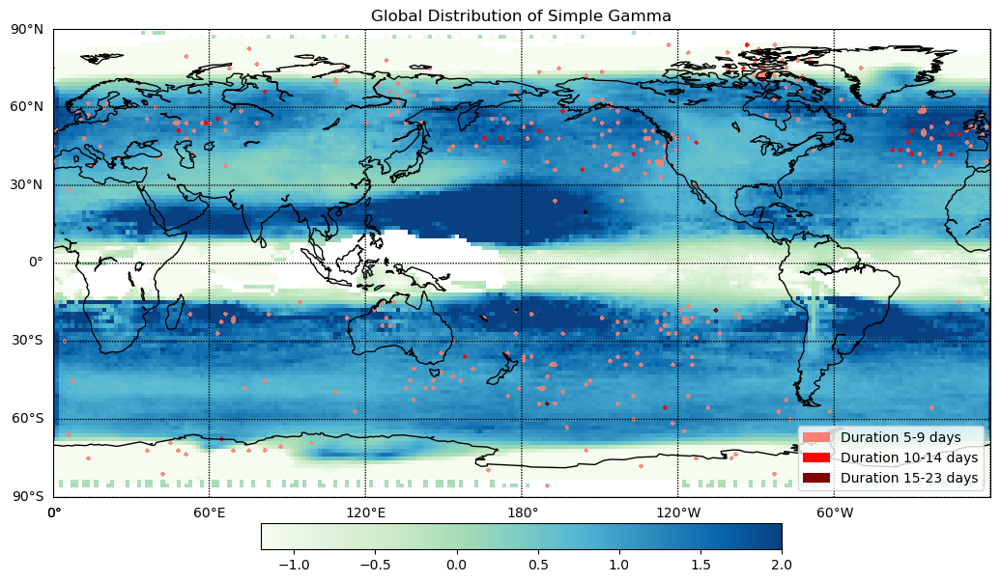

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Patch

# Specify the output directory
directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/"
output_dir = "/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/"

capacity = (reduced_Cg +time_averaged_Uref) ** 2

capacity /= (-4 * alpha_data_djf)

# Load data
LWA_avg = np.load(directory + "LWA_average.npy")
F_total_avg = np.load(directory + "F_total_average.npy")
flux_capacity_2d = capacity
lwa_capacity_2d = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/LWA_Capacity.npy")

# Calculate gamma_LWA_DJF and gamma_Flux_DJF
gamma_LWA_DJF = np.divide(LWA_avg, lwa_capacity_2d, out=np.zeros_like(LWA_avg), where=lwa_capacity_2d!=0)
gamma_Flux_DJF = np.divide(F_total_avg, flux_capacity_2d, out=np.zeros_like(F_total_avg), where=flux_capacity_2d!=0)
vmin_val = np.nanpercentile(gamma_Flux_DJF, 15)
vmax_val = np.nanpercentile(gamma_Flux_DJF, 90)
print(vmin_val)
print(vmax_val)

# Load blocking events data
data1 = np.load(output_dir + 'BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load(output_dir + 'BlockingEventDate4.0SH.npy', allow_pickle=True)

# Vertically stack the arrays
blocking_data = np.vstack((data1, data2))

# Filter rows based on the month and year condition
filtered_blocking_data = []
for event in blocking_data:
    event_date = event[0]
    if event_date.month in [1, 2, 12] and 1979 <= event_date.year <= 2016:
        filtered_blocking_data.append(event)

# Convert the filtered list back to a NumPy array
blocking_data = np.array(filtered_blocking_data)

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create different grids for different duration ranges
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Function to plot heatmap and overlay blocking events
def plot_heatmap(values, title, vmin, vmax):
    plt.figure(figsize=(15, 7))
    m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=360, urcrnrlat=90)
    m.drawcoastlines()
    m.drawparallels(np.arange(-90, 91, 30), labels=[1, 0, 0, 0])
    m.drawmeridians(np.arange(0, 361, 60), labels=[0, 0, 0, 1])
    lon, lat = np.meshgrid(np.linspace(0, 360, 240), np.linspace(-90, 90, 121))
    x, y = m(lon, lat)
    cs = m.pcolormesh(x, y, values, cmap="GnBu", vmin=vmin, vmax=vmax)
    
    # Define colors for different duration ranges
    color_5_9 = 'salmon'
    color_10_14 = 'red'
    color_15_23 = 'maroon'
    
    m.contourf(x, y, blocking_grid_5_9, levels=[0.5, 1.5], colors=[color_5_9], alpha=0.9)
    m.contourf(x, y, blocking_grid_10_14, levels=[0.5, 1.5], colors=[color_10_14], alpha=0.9)
    m.contourf(x, y, blocking_grid_15_23, levels=[0.5, 1.5], colors=[color_15_23], alpha=0.9)
    
    # Create a custom legend for the colored blocking events
    legend_elements = [Patch(facecolor=color_5_9, label='Duration 5-9 days'),
                       Patch(facecolor=color_10_14, label='Duration 10-14 days'),
                       Patch(facecolor=color_15_23, label='Duration 15-23 days')]
    
    plt.legend(handles=legend_elements, loc='lower right')
    plt.colorbar(cs, orientation='horizontal', fraction=0.05, pad=0.05)
    plt.title(title)
    plt.show()

# Plotting the heatmaps
plot_heatmap(gamma_Flux_DJF, "Global Distribution of Simple Gamma", 0, 1)
plot_heatmap(gamma_Flux_DJF, "Global Distribution of Simple Gamma", -1.2, 2)
# plot_heatmap(gamma_Flux_DJF, "Global Distribution of Simple Gamma", vmin_val, vmax_val)
# plot_heatmap(gamma_LWA_DJF, "Global Distribution of Climatology LWA Divided by LWA Capacity DJF", 0, 1)


-0.5317529412011464
3.382817901967121


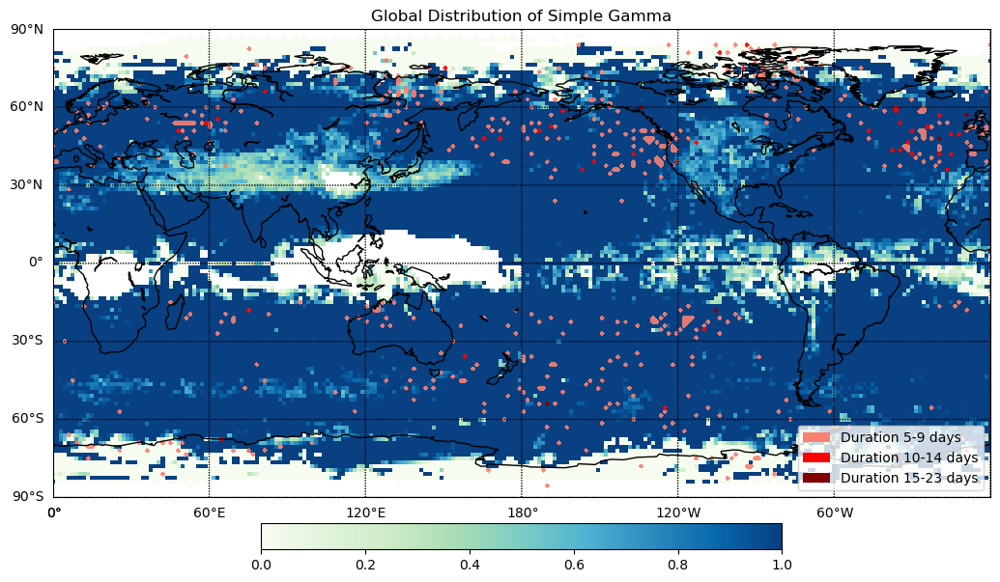

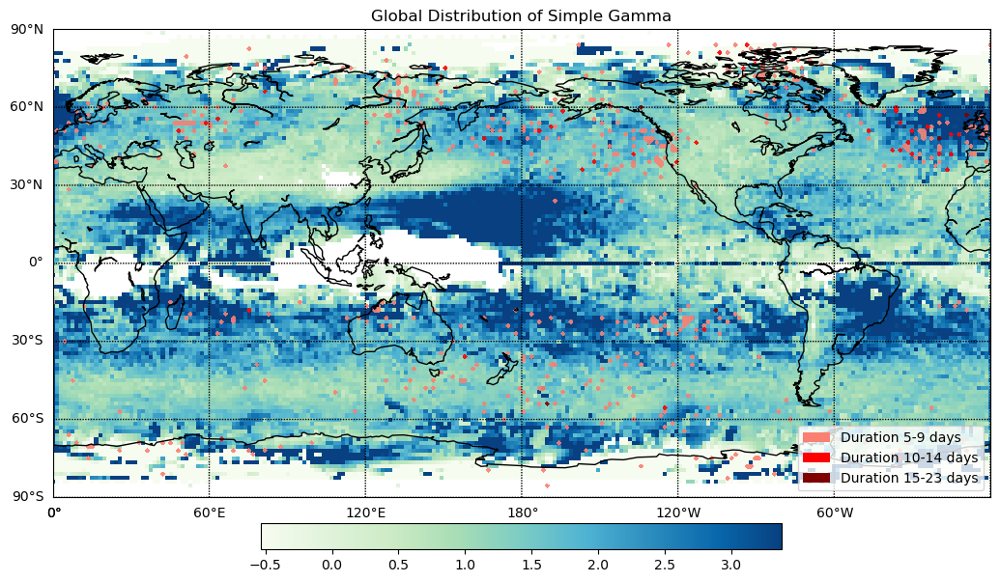

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Patch

# Specify the output directory
directory = "/scratch/negishi/yan481/KenYan_Traffic_Model/Scatter_Plot_Global_New_DJF/"
output_dir = "/scratch/negishi/yan481/KenYan_Traffic_Model/Ka Ying Blocking Data/"

# Compute capacity array
capacity = (reduced_Cg + time_averaged_Uref + 2 * product_data) ** 2

# Divide capacity by alpha_data
capacity /= (-4 * alpha_data_djf)
capacity[(capacity < -80) | (capacity > 1200)] = np.nan

# Load data
LWA_avg = np.load(directory + "LWA_average.npy") - np.load(directory + "LWA_minimum.npy")
F_total_avg = np.load(directory + "F_total_average.npy")- np.load(directory + "F_total_minimum.npy")
flux_capacity_2d = capacity
lwa_capacity_2d = np.load("/scratch/negishi/yan481/KenYan_Traffic_Model/LWA_Capacity.npy")

# Calculate gamma_LWA_DJF and gamma_Flux_DJF
gamma_LWA_DJF = np.divide(LWA_avg, lwa_capacity_2d, out=np.zeros_like(LWA_avg), where=lwa_capacity_2d!=0)
gamma_Flux_DJF = np.divide(F_total_avg, flux_capacity_2d, out=np.zeros_like(F_total_avg), where=flux_capacity_2d!=0)
vmin_val = np.nanpercentile(gamma_Flux_DJF, 10)
vmax_val = np.nanpercentile(gamma_Flux_DJF, 90)
print(vmin_val)
print(vmax_val)

# Load blocking events data
data1 = np.load(output_dir + 'BlockingEventDate4.0NH.npy', allow_pickle=True)
data2 = np.load(output_dir + 'BlockingEventDate4.0SH.npy', allow_pickle=True)

# Vertically stack the arrays
blocking_data = np.vstack((data1, data2))

# Filter rows based on the month condition
blocking_data = blocking_data[np.isin([dt.month for dt in blocking_data[:, 0]], [1, 2, 12])]

longitudes = [int(row[2].split(":")[1].strip()) for row in blocking_data]
latitudes = [int(row[3].split(":")[1].strip()) for row in blocking_data]
durations = [int(row[1].split(":")[1].strip()) for row in blocking_data]

# Create different grids for different duration ranges
blocking_grid_5_9 = np.zeros((121, 240))
blocking_grid_10_14 = np.zeros((121, 240))
blocking_grid_15_23 = np.zeros((121, 240))

for lon, lat, duration in zip(longitudes, latitudes, durations):
    if 5 <= duration <= 9:
        blocking_grid_5_9[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 10 <= duration <= 14:
        blocking_grid_10_14[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1
    elif 15 <= duration <= 23:
        blocking_grid_15_23[int((lat + 90) * 120 / 180), int(lon * 240 / 360)] = 1

# Function to plot heatmap and overlay blocking events
def plot_heatmap(values, title, vmin, vmax):
    plt.figure(figsize=(15, 7))
    m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=360, urcrnrlat=90)
    m.drawcoastlines()
    m.drawparallels(np.arange(-90, 91, 30), labels=[1, 0, 0, 0])
    m.drawmeridians(np.arange(0, 361, 60), labels=[0, 0, 0, 1])
    lon, lat = np.meshgrid(np.linspace(0, 360, 240), np.linspace(-90, 90, 121))
    x, y = m(lon, lat)
    cs = m.pcolormesh(x, y, values, cmap="GnBu", vmin=vmin, vmax=vmax)
    
    # Define colors for different duration ranges
    color_5_9 = 'salmon'
    color_10_14 = 'red'
    color_15_23 = 'maroon'
    
    m.contourf(x, y, blocking_grid_5_9, levels=[0.5, 1.5], colors=[color_5_9], alpha=0.9)
    m.contourf(x, y, blocking_grid_10_14, levels=[0.5, 1.5], colors=[color_10_14], alpha=0.9)
    m.contourf(x, y, blocking_grid_15_23, levels=[0.5, 1.5], colors=[color_15_23], alpha=0.9)
    
    # Create a custom legend for the colored blocking events
    legend_elements = [Patch(facecolor=color_5_9, label='Duration 5-9 days'),
                       Patch(facecolor=color_10_14, label='Duration 10-14 days'),
                       Patch(facecolor=color_15_23, label='Duration 15-23 days')]
    
    plt.legend(handles=legend_elements, loc='lower right')
    plt.colorbar(cs, orientation='horizontal', fraction=0.05, pad=0.05)
    plt.title(title)
    plt.show()

# Plotting the heatmaps
plot_heatmap(gamma_Flux_DJF, "Global Distribution of Simple Gamma", 0, 1)
plot_heatmap(gamma_Flux_DJF, "Global Distribution of Simple Gamma", vmin_val, vmax_val)
# plot_heatmap(gamma_LWA_DJF, "Global Distribution of Climatology LWA Divided by LWA Capacity DJF", 0, 1)
